In [1]:
import pandas as pd
import numpy as np
import re

import seaborn as sns
import ipywidgets as widgets
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d, Axes3D

import folium 
from folium import plugins 

from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.patches as mpatches
import json
from dateutil.parser import parse
%matplotlib inline

# Data Loading

In [2]:
food = pd.read_csv("data/food-inspections.csv")

In [3]:
# Find all columns with at least one null value
null_cols=np.sum(food.isnull() , axis=0)
null_cols[null_cols>0]

AKA Name                        2457
License #                         17
Facility Type                   4779
Risk                              73
City                             138
State                             42
Zip                               50
Inspection Type                    1
Violations                     51935
Latitude                         688
Longitude                        688
Location                         688
Historical Wards 2003-2015    195796
Zip Codes                     195796
Community Areas               195796
Census Tracts                 195796
Wards                         195796
dtype: int64

In [4]:
food.shape

(195796, 22)

Text(0.5,0,'Number of nans')

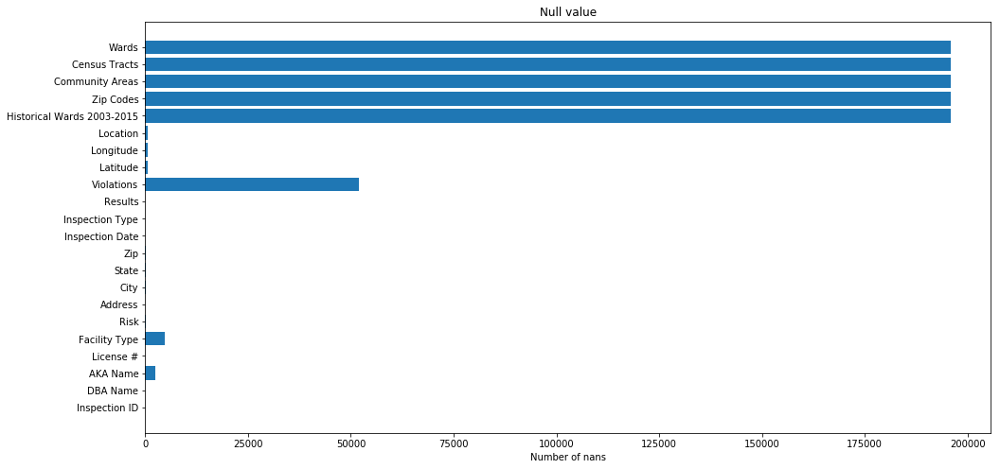

In [5]:
# Lets plot the nans
fig, ax = plt.subplots(figsize=(16,8))
ax.barh(null_cols.index, null_cols.values)
ax.set_title("Null value")
ax.set_xlabel("Number of nans")

 # Data Cleaning & Munging

The columns Historical Wards 2003-2015 , Zip Codes , Community Areas , Census Tracts and Ward are all empty. So we drop them

In [6]:
food.drop(columns=["Historical Wards 2003-2015","Zip Codes", "Community Areas", "Census Tracts", "Wards"],axis=1,inplace=True)

## Results

In [7]:
results_count = food["Results"].value_counts(sort=False)
results_count

Out of Business          16844
Not Ready                 1877
No Entry                  6237
Pass                    105795
Pass w/ Conditions       27105
Fail                     37870
Business Not Located        68
Name: Results, dtype: int64

Text(0.5,1,'Repartition of the results')

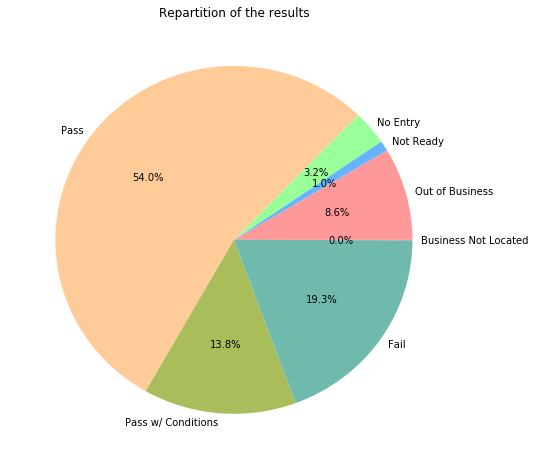

In [8]:
fig, ax = plt.subplots(figsize=(8,8))

colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#A9BD5A',"#6FBAaD"]

ax.pie(results_count.values,labeldistance=1.05,colors=colors, labels=results_count.index, autopct='%1.1f%%',
          startangle=0)

plt.title("Repartition of the results")

We are interested in business with inspections that pass or fail so we retain those

In [9]:
results=["Pass","Fail","Pass w/ Conditions"]
food=food[food["Results"].isin(results)]
food.shape

(170770, 17)

### Inspection Date

In [10]:
food["Inspection Date"].head()

0    2019-11-08T00:00:00.000
1    2019-11-08T00:00:00.000
2    2019-11-08T00:00:00.000
4    2019-11-08T00:00:00.000
5    2019-11-08T00:00:00.000
Name: Inspection Date, dtype: object

In [11]:
food["Inspection Date"] = food["Inspection Date"].apply(lambda d: parse(d))

In [12]:
food['Year'] = food["Inspection Date"].map(lambda x: x.year)
food['Month'] = food["Inspection Date"].map(lambda x: x.month)
food['Day'] = food["Inspection Date"].map(lambda x: x.day)

It makes sense to have the dataset in chronological order, so we sort it accordingly

In [13]:
food = food.sort_values(by="Inspection Date")

In [14]:
food.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,City,State,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Year,Month,Day
195795,52234,Cafe 608,Cafe 608,2013328.0,Restaurant,Risk 1 (High),608 W BARRY AVE,CHICAGO,IL,60657.0,2010-01-04,License Re-Inspection,Pass,NaN,41.938007,-87.644755,"{'longitude': '41.938006880423615', 'latitude'...",2010,1,4
195789,67732,WOLCOTT'S,TROQUET,1992039.0,Restaurant,Risk 1 (High),1834 W MONTROSE AVE,CHICAGO,IL,60613.0,2010-01-04,License Re-Inspection,Pass,NaN,41.961606,-87.675967,"{'longitude': '41.961605669949854', 'latitude'...",2010,1,4
195790,67733,WOLCOTT'S,TROQUET,1992040.0,Restaurant,Risk 1 (High),1834 W MONTROSE AVE,CHICAGO,IL,60613.0,2010-01-04,License Re-Inspection,Pass,NaN,41.961606,-87.675967,"{'longitude': '41.961605669949854', 'latitude'...",2010,1,4
195794,104236,TEMPO CAFE,TEMPO CAFE,80916.0,Restaurant,Risk 1 (High),6 E CHESTNUT ST,CHICAGO,IL,60611.0,2010-01-04,Canvass,Fail,18. NO EVIDENCE OF RODENT OR INSECT OUTER OPEN...,41.898431,-87.628009,"{'longitude': '41.89843137207629', 'latitude':...",2010,1,4
195792,70269,mr.daniel's,mr.daniel's,1899292.0,Restaurant,Risk 1 (High),5645 W BELMONT AVE,CHICAGO,IL,60634.0,2010-01-04,License Re-Inspection,Pass,NaN,41.938443,-87.768318,"{'longitude': '41.93844282365204', 'latitude':...",2010,1,4


### Zip

Since there are only 31 cases with nan zip, we simply drop them

In [15]:
food=food[food["Zip"].notnull()]

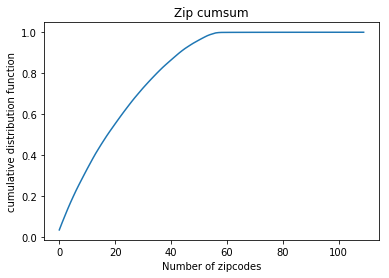

In [16]:
zip_=food["Zip"].value_counts().cumsum()/food.shape[0]
zip_=zip_.reset_index()
plt.plot(zip_["Zip"])
plt.title("Zip cumsum")
plt.xlabel("Number of zipcodes")
plt.ylabel("cumulative distribution function")
plt.show()

20 Zipcodes out of 110 are where more than half of inspections take place, it's interesting to check in our further analysis whether these places are just highly dense or are they actually more prone to food inspections

### City and State

In [17]:
food[food.State.isnull() & food.City.isnull()]["Address"].unique()

array(['636 N RACINE AVE ', '500 N MILWAUKEE AVE ',
       '506 N Milwaukee AVE ', '1438 W CORTLAND ST '], dtype=object)

All Null values in State and City are in Chicago ( checked with the respective adresses)

In [18]:
food[food.State.isnull() & food.City.notnull()]["City"].unique()

array(['CHICAGO'], dtype=object)

Null values in State with a known city are all in Chicago

In [19]:
food[(food.City.isnull()) & (food["State"]!="IL")]["Address"].unique()

array(['636 N RACINE AVE ', '500 N MILWAUKEE AVE ',
       '506 N Milwaukee AVE ', '1438 W CORTLAND ST '], dtype=object)

All Null values in City are in Chicago ( checked with the respective adresses)

In [20]:
food["State"].fillna("IL", inplace=True)
food=food[food["State"]=="IL"]
food["City"].fillna("Chicago", inplace=True)

In [21]:
food[food["City"]!="CHICAGO"]["City"].unique()

array(['Chicago', 'chicago', 'CCHICAGO', 'CHESTNUT STREET',
       'CHICAGOCHICAGO', 'CHCICAGO', 'CHCHICAGO', 'OAK PARK',
       'EVERGREEN PARK', 'ALSIP', 'CHARLES A HAYES', 'EAST HAZEL CREST',
       'MAYWOOD', 'Maywood', 'WORTH', 'CHicago', 'BROADVIEW',
       'BLUE ISLAND', 'NAPERVILLE', 'FRANKFORT', 'GLENCOE', 'CHICAGOI',
       'OAK LAWN', 'CICERO', 'STREAMWOOD', 'OLYMPIA FIELDS', 'BERWYN',
       'LAKE ZURICH', 'DES PLAINES', 'BURNHAM', 'SUMMIT', 'BOLINGBROOK',
       'COUNTRY CLUB HILLS', 'LOMBARD', 'CHICAGO HEIGHTS', 'TINLEY PARK',
       'JUSTICE', 'OOLYMPIA FIELDS', 'ELK GROVE VILLAGE', 'EVANSTON',
       'CALUMET CITY', 'SKOKIE', 'Norridge', 'ELMHURST', 'BLOOMINGDALE',
       'SCHAUMBURG', 'BANNOCKBURNDEERFIELD', 'BEDFORD PARK',
       'SCHILLER PARK', 'BRIDGEVIEW', 'NILES NILES', '312CHICAGO',
       'LAKE BLUFF', 'CHICAGOHICAGO', 'PALOS PARK', 'PLAINFIELD',
       'HIGHLAND PARK', 'CHICAGO.', 'ROSEMONT', 'WHEATON', 'WADSWORTH',
       'LANSING', 'ALGONQUIN'], dtype=object

In [22]:
Illinois_zipcode=(60001,62999)
suburbs_zipcode=food[food["City"]!="CHICAGO"]["Zip"].unique()
# All the suburbs are within the Illinois zipcode range
all(Illinois_zipcode[0]<=city_zipcode<=Illinois_zipcode[1] for city_zipcode in suburbs_zipcode)

True

All these values are either typos for Chicago or Chicago suburbs (checked by zip code), so we keep them.

Since the columns City and State don't give us relevant information, we drop them

In [23]:
food=food.drop(columns=["City","State"])

### Location

In [24]:
# Fill the null location values with default Chicago location
default_lat=41.85003
default_long=-87.65005
default_location='(-87.65005,41.85003)'
food[food["Location"]==default_location]

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,Results,Violations,Latitude,Longitude,Location,Year,Month,Day


No other business has this location, so we can drop it when we need to plot

In [25]:
food["Latitude"].fillna(default_lat,inplace=True)
food["Longitude"].fillna(default_long,inplace=True)
food["Location"].fillna(default_location,inplace=True)

In [26]:
food_plot = food[food["Location"] != default_location]

In [27]:
m = folium.Map([41.85003, -87.65005], zoom_start=10)

sample_locaions = food_plot.sample(30000)[["Latitude", "Longitude"]].values

m.add_child(plugins.HeatMap(sample_locaions.tolist(), radius=10))
m


### License number

In [28]:
food[food["License #"].isnull()].shape

(16, 18)

In [29]:
food.groupby("License #").Location.nunique().sort_values(ascending=False).head()

License #
0.0          192
2458393.0      3
2232394.0      2
24382.0        2
2535189.0      2
Name: Location, dtype: int64

Since there are 16 nans, and we see that a lot of unidentified license are set to 0, we set them also to 0

In [30]:
food["License #"].fillna(0,inplace=True)

### Violations

As seen in the dataset description:

An establishment can receive one or more of 45 distinct violations (violation
numbers 1-44 and 70). For each violation number listed for a given establishment, the
requirement the establishment must meet in order for it to NOT receive a violation is
noted, followed by a specific description of the findings that caused the violation to be
issued.

For the null values in Violations, we will just replace them with "0. None reported" since the violations are numbered

In [31]:
food["Violations"].fillna("0. None Reported", inplace=True)

It's specified in the Food Inspection Reporting System (https://webapps1.chicago.gov/healthinspection/Code_Violations.jsp#1crit) 
that we can have 3 types of violation :

    -For violation number 1-14 it refers to critical violations.
    -For violation number 15-29 it refers to serious violations.
    -For the rest it refers to no critical violations,minor (30-44,70). 

For each inspection we have a list of a description of each violation discovered, the description is composed of 3 elements:
   
    -The violation number
    -The violation title
    -Comments

Therefore we parse the descriptions to separate the 3 entities.

In [32]:
# Initiating the 3 columns
violation_number = []
violation_title = []
violation_comment = []
# Initiating the exploded dataframe with 4 columns : ids, number , title and comments
number_exploded = []
ids_exploded = []
title_exploded = []
comment_exploded = []
    
def violation_parsing(row):
    """
    This function iterates over the Violations columns in the original dataset and returns three seperate columns:
    Violation number, title and comments
    Also, it returns a new dataframe where all seperate violations tuples have unique rows
    """

    # spliting seperate violations
    list_violation= row['Violations'].split(' | ')
    numbers = []
    titles = []
    comments = []
    for vl in list_violation:

        ids_exploded.append(row['Inspection ID'])

        # splitting the title from the comments
        comment_splited = vl.split('- Comments:')

        # splitting the number from the title
        split_point = comment_splited[0].split('.')

        # appending the number
        numbers.append(split_point[0])
        number_exploded.append(split_point[0])

        #appending the title
        titles.append(split_point[1].strip())
        title_exploded.append(split_point[1].strip())

        # checking whether a comment exists and then appending it, otherwise we append an empty comment
        if(len(comment_splited) <= 1):
            comments.append("")
            comment_exploded.append("")
        else:
            comments.append(comment_splited[1].strip())
            comment_exploded.append(comment_splited[1].strip())

    violation_number.append(numbers)
    violation_title.append(titles)
    violation_comment.append(comments)



In [33]:
food.apply(violation_parsing,axis=1)
violation_exploded = pd.DataFrame({"ids": ids_exploded ,"numbers" : number_exploded , "titles" : title_exploded, "comments" : comment_exploded})
food ['Violation numbers'] =violation_number
food ['Violation title']=violation_title
food ['Violation comments']=violation_comment 

In [34]:
# showing all different violation codes
count_violation = violation_exploded.groupby(['numbers']).comments.count()
count_violation.index = count_violation.index.map(lambda x: int(x))
count_violation = count_violation.sort_index()
count_violation.index

Int64Index([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
            17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
            34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
            51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 70],
           dtype='int64', name='numbers')

We are surprised to find violation numbers that are above 44 ! This is really weird as it was not specified in the Food Inspection Reporting System.

In [35]:
# showing their respective titles
weird_cases = violation_exploded[(violation_exploded['numbers'].astype(int) > 44) & (violation_exploded['numbers'] != "70") ]

weird_cases.groupby(['numbers']).titles.value_counts()

numbers  titles                                                                           
45       FOOD HANDLER REQUIREMENTS MET                                                         7468
         SINGLE-USE/SINGLE-SERVICE ARTICLES: PROPERLY STORED & USED                             429
46       GLOVES USED PROPERLY                                                                    78
47       FOOD & NON-FOOD CONTACT SURFACES CLEANABLE, PROPERLY DESIGNED, CONSTRUCTED & USED     6724
48       WAREWASHING FACILITIES: INSTALLED, MAINTAINED & USED; TEST STRIPS                     1741
49       NON-FOOD/FOOD CONTACT SURFACES CLEAN                                                  4828
50       HOT & COLD WATER AVAILABLE; ADEQUATE PRESSURE                                          293
51       PLUMBING INSTALLED; PROPER BACKFLOW DEVICES                                           5732
52       SEWAGE & WASTE WATER PROPERLY DISPOSED                                                 389
53       

In [36]:
colors = ["Purple"] + ["red"] * 14 + ["orange"] * 15 + ["yellow"] *15 + ["green"] *19 + ["yellow"]
df_count = pd.DataFrame({'number' : count_violation.index, 'count' :  count_violation.values, 'color' : colors} )

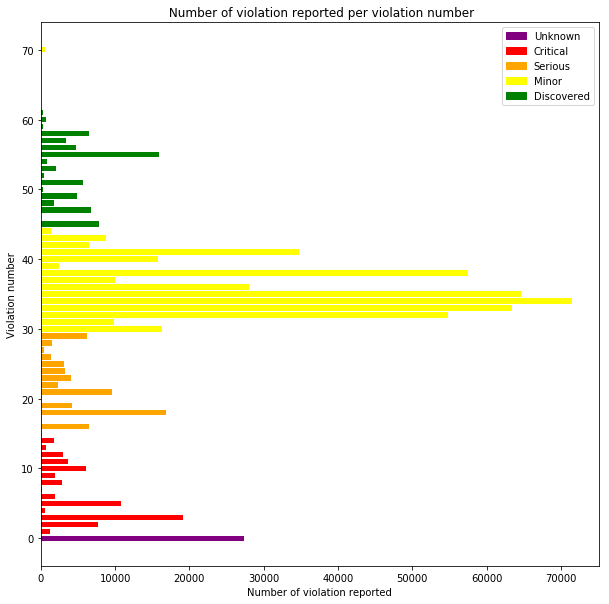

In [37]:
# plotting violations frequencies
fig, ax = plt.subplots(figsize=(10,10))
ax.barh(df_count['number'] ,df_count['count'], color = df_count['color'])

UK = mpatches.Patch(color='purple', label='Unknown')
CR = mpatches.Patch(color='red', label='Critical')
SR = mpatches.Patch(color='orange', label='Serious')
MI = mpatches.Patch(color='yellow', label='Minor')
DS = mpatches.Patch(color='green', label='Discovered')
plt.legend(handles=[UK,CR,SR,MI,DS], loc=1)
plt.xlabel("Number of violation reported")
plt.ylabel("Violation number")
plt.title(" Number of violation reported per violation number")
plt.show()

For each inspection we consider a score that counts the number of violations per type of violation (minor,serious,critical). 

The new violation numbers (44-63) are grouped with the minor violations.

In [38]:
def score(numbers):
    """ This function creates a score for the violation according to its category (minor,serious,critical)
    and returns the score as a tuple
    """
    minor = 0
    serious = 0
    critical = 0
    for number in numbers:
        number = int(number)
        if( (number >=1) & (number <=14) ):
            critical+=1
        elif ((number >=15) and (number <=29) ) :
            serious+=1
        elif (number >29) :  
            minor+=1
    return minor,serious,critical

food['Violation score minor']    = food ['Violation numbers'].map(lambda x : score(x)[0])
food['Violation score serious']  = food ['Violation numbers'].map(lambda x : score(x)[1])
food['Violation score critical'] = food ['Violation numbers'].map(lambda x : score(x)[2])

Depending on that score we want to know how the results evolve. 

In [39]:
#group by score and count the the number of inspection 
violation_score = food.groupby(['Violation score minor','Violation score serious','Violation score critical']).Results.value_counts().unstack().reset_index()
violation_score.fillna(0, inplace=True)

#transforming the count to an empirical probability
sums = violation_score.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))
violation_score.loc[:,['Fail','Pass','Pass w/ Conditions']]= violation_score.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

violation_score.head()

Results,Violation score minor,Violation score serious,Violation score critical,Fail,Pass,Pass w/ Conditions
0,0,0,0,0.112960,0.870622,0.016419
1,0,0,1,0.357391,0.044348,0.598261
2,0,0,2,0.111831,0.021070,0.867099
3,0,0,3,0.220779,0.000000,0.779221
4,0,0,4,0.300000,0.000000,0.700000


<IPython.core.display.Javascript object>


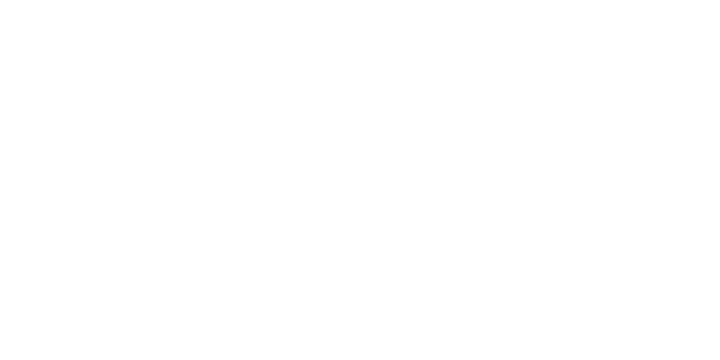

<IPython.core.display.Javascript object>


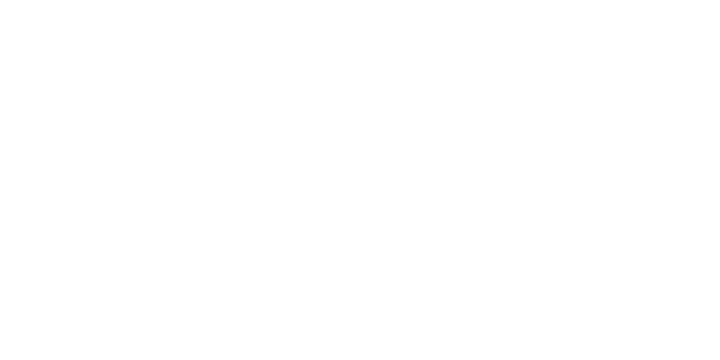

In [40]:
#We create a 3D space representing the score space and we plot  the probability to fail in that space
%matplotlib notebook
fig = plt.figure(figsize=(10,5))
ax = Axes3D(fig)

p=ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Fail'], cmap='YlOrRd',s=30)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to fail with the number of failed violations")

fig.colorbar(p,label="Probability to fail")

plt.show()


We can observe in this 3D plot the probability to fail depending on the number of violations per category.
Depending on the axis we can observe that the increase of the violations has a different impact on the probability to fail.
The violation score minor doesn't affect the probability to fail where as when we start to increase just a little bit the serious or critical score the probability to fail becomes very close to 1. 

<IPython.core.display.Javascript object>


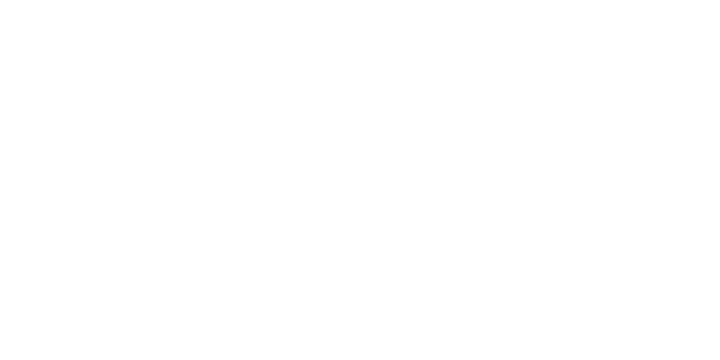

<IPython.core.display.Javascript object>


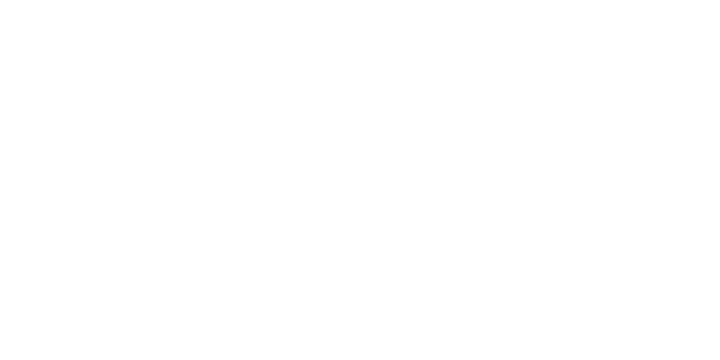

In [41]:
#plotting the probability to pass in the space of the score 

fig = plt.figure(figsize=(10,5))

ax = Axes3D(fig)

p = ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Pass'], cmap='YlOrRd',s=40)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to pass with the number of failed violations")

fig.colorbar(p,label="Probability to pass")

plt.show()

We observe that the violation score minor doesn't affect the probability to pass. We also see that there is a high probability to pass if there are very few serious and critical violation scores

<IPython.core.display.Javascript object>


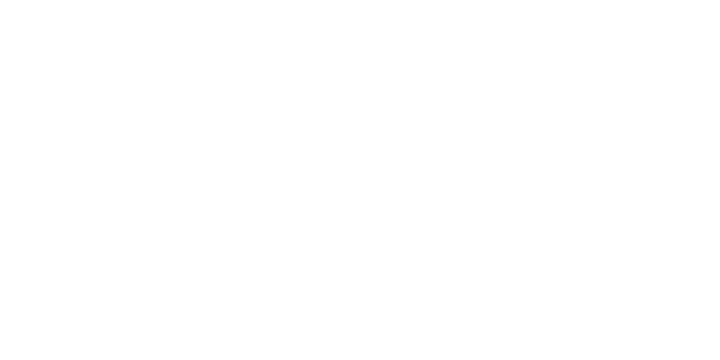

<IPython.core.display.Javascript object>


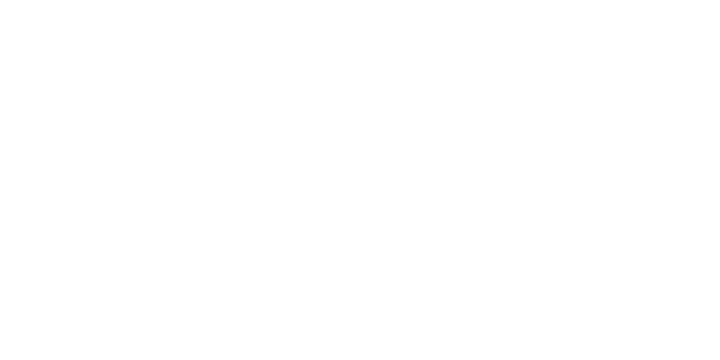

In [42]:
#plotting the probability to pass with condition in the space of the score 

fig = plt.figure(figsize=(10,5))

ax = Axes3D(fig)

p = ax.scatter3D(violation_score['Violation score minor'], violation_score['Violation score serious'], violation_score['Violation score critical'], c=violation_score['Pass w/ Conditions'], cmap='YlOrRd',s=40)

ax.set_xlabel('Violation score minor')
ax.set_ylabel('Violation score serious')
ax.set_zlabel('Violation score critical')
ax.set_title("Probaiblity to Pass w/ Conditions with the number of failed violations")

fig.colorbar(p,label="Probability to pass with condition")
plt.show()

In this plot we can see that if you have low scores you will not pass with condition because you will just pass and if you have high scores you will fail. We can observe that if you have a lot of minor violations you have a high probability to pass with conditions .

In [43]:
food.groupby('Results')['Violation score minor'].mean()

Results
Fail                  3.949548
Pass                  2.490187
Pass w/ Conditions    3.540221
Name: Violation score minor, dtype: float64

In [44]:
food.groupby('Results')['Violation score serious'].mean()

Results
Fail                  1.153732
Pass                  0.003630
Pass w/ Conditions    0.589520
Name: Violation score serious, dtype: float64

In [45]:
food.groupby('Results')['Violation score critical'].mean()

Results
Fail                  0.723678
Pass                  0.004509
Pass w/ Conditions    1.235535
Name: Violation score critical, dtype: float64

### Facility Type

In [46]:
food["Facility Type"]=food["Facility Type"].str.casefold()

In [47]:
# We can check different grocery store types and set them all to "grocery store"
groceries=food[["grocer" in  str(facility) for facility in food["Facility Type"]]]["Facility Type"]
groceries.unique()

array(['grocery store', 'grocery& restaurant', 'slaughter house/ grocery',
       'grocery/cafe', 'gas station/ grocery store',
       'grocery(sushi prep)', 'pharmacy/grocery', 'grocery and butcher',
       'grocery/butcher', 'grocery/restaurant', 'grocery store/bakery',
       'drug/grocery store', 'grocery store/taqueria', 'grocery/liquor',
       'grocery/taqueria', 'gas station /grocery', 'restaurant/grocery',
       'grocery & restaurant', 'restaurant/grocery store',
       'grocery store/cooking school', 'grocery/ restaurant',
       'rest/grocery', 'grocery store/ restaurant',
       'grocery store/gas station', 'drug store/grocery', 'grocery',
       'grocery/dollar store', 'grocery/service gas station',
       'gas station/store grocery', 'grocery/bakery',
       'dollar store selling grocery', 'grocery store/deli',
       'grocery store / gas station', 'bakery/grocery',
       'grocery/gas station', 'grocery/tavern', 'grocery/liquor store',
       'grocery/drug store', 'doll

In [48]:
food.loc[["grocer" in  str(facility) for facility in food["Facility Type"]],"Facility Type"]="grocery store"

In [49]:
fvc=food["Facility Type"].value_counts()
fvc[fvc>20].head(10)

restaurant                         115170
grocery store                       22377
school                              11749
children's services facility         2914
bakery                               2519
daycare (2 - 6 years)                2374
daycare above and under 2 years      2223
long term care                       1292
catering                              991
mobile food dispenser                 797
Name: Facility Type, dtype: int64

In [50]:
print("We have {0} other categories for a total number of {1} businesses".format(fvc[fvc<20].shape[0], fvc[fvc<20].sum()))

We have 330 other categories for a total number of 1488 businesses


In [51]:
fvc[fvc<20].head(20)

after school program                 19
paleteria                            19
roof top                             19
supportive living                    18
hotel                                18
nursing home                         18
mobile desserts vendor               18
gas station/mini mart                17
wrigley roof top                     17
rooftops                             16
brewery                              16
pop-up establishment host-tier ii    16
university cafeteria                 15
long term care facility              15
fitness center                       15
theatre                              15
airport lounge                       14
wrigley rooftop                      14
health/ juice bar                    14
mobile food truck                    14
Name: Facility Type, dtype: int64

We don't see a proper way to aggregate these outliers, so it might be interesting to set them to other

In [52]:
lower_than_20 = fvc[fvc<20].index

food.loc[food["Facility Type"].isin(lower_than_20),"Facility Type"] ="other" 

For the null values in Facility Type, we will just replace them with "Unspecified"

In [53]:
food["Facility Type"].fillna("Unspecified", inplace=True)

Now we can see a proper distribution for the top 10 facilities

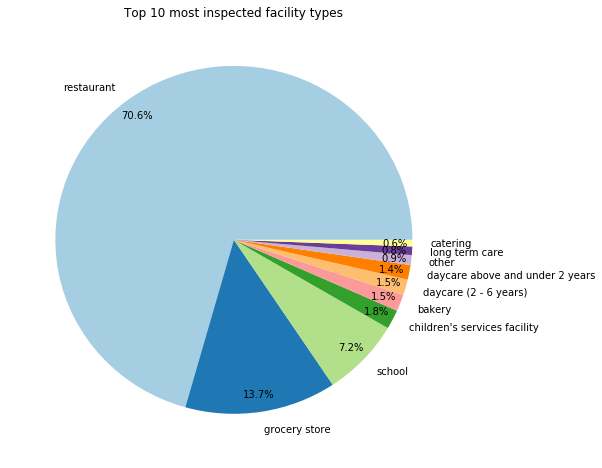

In [54]:
%matplotlib inline
top10_facilities=food["Facility Type"].value_counts().head(10)
fig1, ax1 = plt.subplots(figsize=(8,8))
theme = plt.get_cmap('Paired')
ax1.set_prop_cycle("color", [theme(1. * i / 10)
                             for i in range(10)])
ax1.set_title("Top 10 most inspected facility types")
ax1.pie(top10_facilities.values,labeldistance=1.1, labels=top10_facilities.index, autopct='%1.1f%%',
          pctdistance=0.9, startangle=0)

plt.show()

### Risk

In [55]:
food["Risk"].value_counts()

Risk 1 (High)      125730
Risk 2 (Medium)     32957
Risk 3 (Low)        12010
All                     5
Name: Risk, dtype: int64

5 entries are marked as Risk : ALL . As we don't know the meaning of it and that those entries contain many null values,
We choose to drop these entries

In [56]:
food=food[food["Risk"]!="All"].copy()

In [57]:
food[food["Risk"].isnull()]["Inspection ID"].count()

34

34 entries in Risk are null, since there is no appropiate way to impute them, we choose to drop them

In [58]:
food=food[food["Risk"].notnull()]

Let's try to understand how risk is distributed

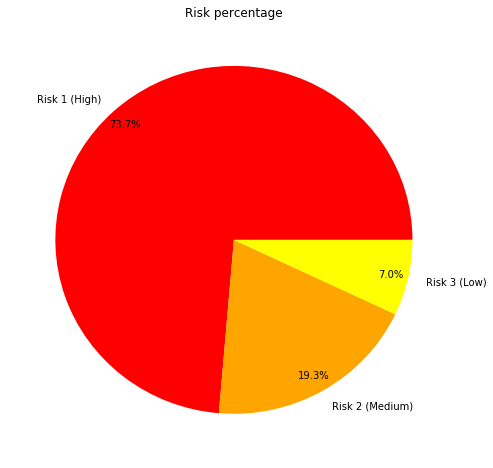

In [59]:
risk_count=food["Risk"].value_counts()
fig, ax = plt.subplots(figsize=(8,8))
ax.set_title("Risk percentage")

ax.pie(risk_count.values,labeldistance=1.1,colors=["red","orange","yellow"], labels=risk_count.index, autopct='%1.1f%%',
          pctdistance=0.9, startangle=0)

plt.show()

Let's see their correlation with the results of inspections

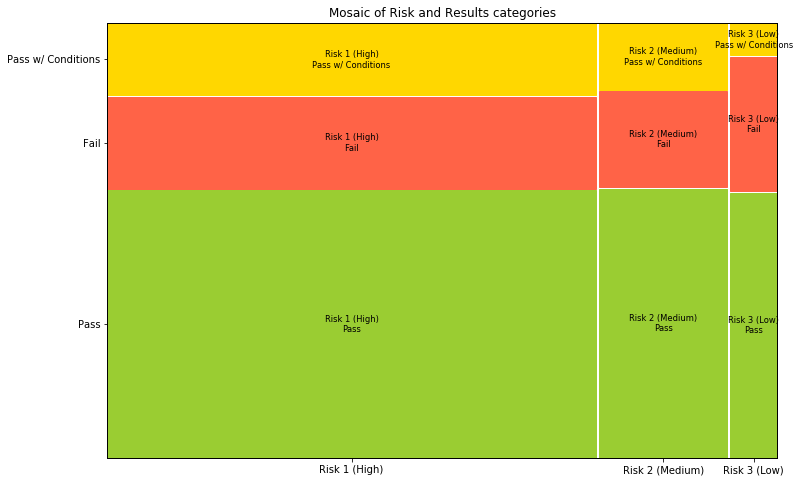

In [60]:
fig, ax = plt.subplots(figsize=(12,8))

props = lambda key: {'color': "yellowgreen" if "Pass" in key else "tomato" if "Fail" in key else "gold"}
mosaic(food,["Risk","Results"], ax=ax ,properties=props)
plt.title("Mosaic of Risk and Results categories")
plt.show()

We see that the pass percentage doesn't really depend on the risk type, although facilities with low risk have slightly more chance to fail

Let's observe the evolution of the risk thought time.

In [61]:
year_inspection_risk = pd.DataFrame(food.groupby(['Year','Risk'])['Inspection ID'].count()).reset_index()

year_inspection_risk = year_inspection_risk.pivot(index='Year', values='Inspection ID', columns='Risk')

year_inspection_risk.fillna(0, inplace=True)

year_inspection_risk

Risk,Risk 1 (High),Risk 2 (Medium),Risk 3 (Low)
Year,,,
2010,11662,3770,1925
2011,11715,4021,1831
2012,11158,3279,1574
2013,12158,3625,1279
2014,13847,3606,1162
2015,13427,3451,1011
2016,15184,3849,828
2017,14409,3206,877
2018,11822,2269,756


Text(0,0.5,'Number')

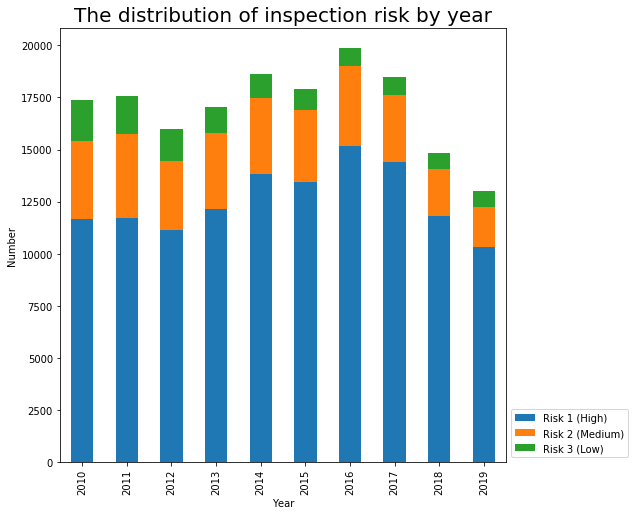

In [62]:
fig, ax = plt.subplots(figsize=(10,10))

year_inspection_risk.plot(kind='bar',stacked=True,figsize=(8,8),ax=ax )

plt.legend(loc="lower left", bbox_to_anchor=(1,0))
ax.set_title("The distribution of inspection risk by year",size=20)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

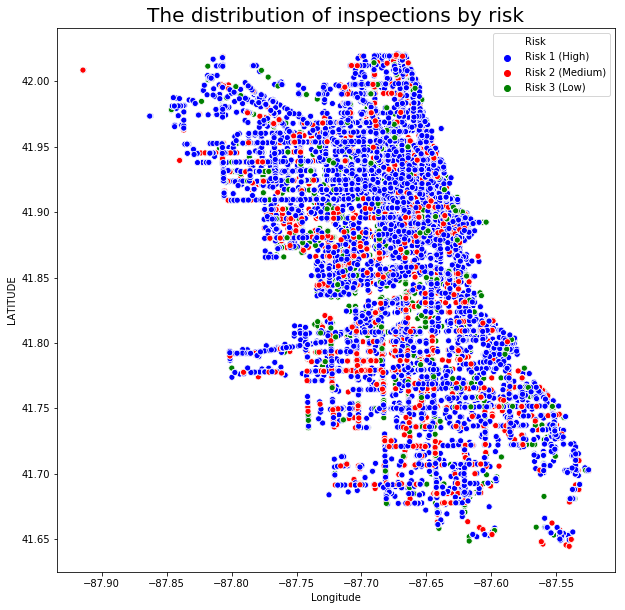

In [63]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x='Longitude', y='Latitude', hue='Risk' , data=food, ax=ax, palette = ["blue","red","green"])
ax.set_title("The distribution of inspections by risk",size=20)
ax.set_xlabel('Longitude')
ax.set_ylabel('LATITUDE')
plt.show()

We can't really see a general pattern let's compute the mean risk per zipcode.

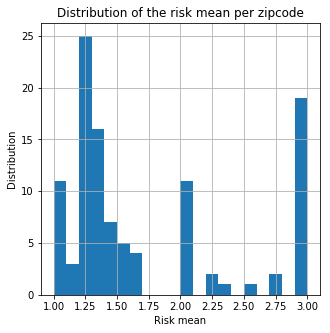

In [64]:
food['Risk number'] = food['Risk'].map(lambda x : int(str(x).split(' ')[1]))
mean_risk_zip = food.groupby('Zip').mean()['Risk number']

fig, ax = plt.subplots(figsize=(5,5))
mean_risk_zip.hist(bins=20)
ax.set_title("Distribution of the risk mean per zipcode")
ax.set_xlabel("Risk mean")
ax.set_ylabel("Distribution")
plt.show()

df_risk_zip = pd.DataFrame({'Zip': mean_risk_zip.index.astype(int).astype(str), 'Risk mean' :mean_risk_zip.values} )


We draw the results on the map using GeoJson zipcode file.

In [65]:
with open("data/Boundaries - ZIP Codes.geojson") as json_file:
    zipcodes = json.load(json_file)
    
m = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.GeoJson(zipcodes).add_to(m)
m.save("initial_zip.html")
m

This is the map of chicago divided by zipcode

In [66]:
m1 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=df_risk_zip,
    columns=['Zip', 'Risk mean'],
    key_on='feature.properties.zip',
    fill_color='RdYlBu',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Risk Mean",
    show=False,
).add_to(m1)

m1.save("zip_risk_mean.html")
m1

We now look at the proportion of fail, pass and pass wtih condition per zip code. 

In [67]:
food.Results.value_counts()

Pass                  105766
Fail                   37831
Pass w/ Conditions     27100
Name: Results, dtype: int64

In [68]:
food.groupby('Zip').Results.count().sort_values(ascending = False)

Zip
60614.0    6200
60647.0    5952
60657.0    5725
60611.0    5654
60622.0    5358
           ... 
60189.0       1
60477.0       1
60464.0       1
60202.0       1
60453.0       1
Name: Results, Length: 107, dtype: int64

In [69]:
# we group by zip and count the number of fail/pass that we normalize after
dist_zip = food.groupby('Zip').Results.value_counts().unstack().reset_index().fillna(0)

# We sum up the groups

sums = dist_zip.loc[:, ['Fail','Pass','Pass w/ Conditions']].sum(axis=1).values.reshape((-1,1))
# We normalize them

dist_zip.loc[:,['Fail','Pass','Pass w/ Conditions']]= dist_zip.loc[:,['Fail','Pass','Pass w/ Conditions']] /sums

# We count the number of samples to have an idea about the significance of our statistics
dist_zip['# of samples'] = food.groupby('Zip').Results.count().values
dist_zip.Zip = dist_zip.Zip.map(lambda x : str(int(x)) ) 
dist_zip.sort_values(ascending = False , by= "# of samples")

Results,Zip,Fail,Pass,Pass w/ Conditions,# of samples
55,60614,0.226290,0.567581,0.206129,6200
87,60647,0.241767,0.597614,0.160618,5952
95,60657,0.223057,0.593188,0.183755,5725
52,60611,0.165193,0.648744,0.186063,5654
63,60622,0.236469,0.614408,0.149123,5358
...,...,...,...,...,...
14,60148,0.000000,1.000000,0.000000,1
29,60438,0.000000,1.000000,0.000000,1
16,60155,0.000000,1.000000,0.000000,1
27,60423,0.000000,1.000000,0.000000,1


In [70]:
dist_zip["Fail"].sort_values()

33    0.000000
21    0.000000
22    0.000000
24    0.000000
26    0.000000
        ...   
7     0.500000
2     0.500000
41    0.666667
39    0.750000
38    0.800000
Name: Fail, Length: 107, dtype: float64

In [71]:
m2 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Fail'],
    key_on='feature.properties.zip',
    fill_color='Reds',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Fail probability",
    show=True,
).add_to(m2)

m2.save("zip_fail.html")
m2

In [72]:
m3 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Pass'],
    key_on='feature.properties.zip',
    fill_color='RdYlGn',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Pass probability",
    show=False,
).add_to(m3)

m3.save("zip_pass.html")
m3

In [73]:
m4 = folium.Map(location=[41.85003,-87.6], tiles='cartodbpositron', zoom_start=10.3)

folium.Choropleth(
    geo_data=zipcodes,
    data=dist_zip,
    columns=['Zip', 'Pass w/ Conditions'],
    key_on='feature.properties.zip',
    fill_color='Blues',
    highlight=True,
    fill_opacity=0.7,
    legend_name="Pass with conditions probability",
    show=False,
).add_to(m4)

m4.save("zip_pass_conditions.html")
m4

### Inspection type

There only is one nul value for Inspection type, we drop it

In [74]:
food = food[food["Inspection Type"].notnull()]

An inspection can be one of the following types: 
    
    -canvass, the mostcommon type of inspection performed at a frequency relative to the risk of the establishment;
    
    -consultation, when the inspection is done at the request of the owner prior to the opening of the establishment; 
    
    -complaint, when the inspection is done in response to a complaint against the establishment;
    
    -license, when the inspection is done as a requirement for the establishment to receive its license to operate;
    
    -suspect food poisoning, when the inspection is done in response to one or more persons claiming to have gotten ill as a result of eating at the establishment (a specific type of complaint-based inspection);

    -task-force inspection, when an inspection of a bar or tavern is done.

Re-inspections can occur for most types of these inspections and are indicated as such. 


In [75]:
food["Inspection Type"].nunique()

102

We observe that we have several inspection's types representing the same thing and thus we can regroup them.

In [76]:
food["Inspection Type exact"] = food["Inspection Type"].copy()

In [77]:
# Hardocde grouping of inspection types
def inspection_cleaning(x):
    
    x=str(x).lower()
    x=re.sub("re-","re",x)
    if ('reinspection' in x ):
        return 'reinspection'
    elif ('sfp' in x or 'fbi' in x or 'sick' in x or 'poisoning' in x ):
        x= 'food poisoning' 
    elif ('canvas' in x ):
        x= 'canvass' 
    elif ('complaint' in x ):
        x="complaint"
    elif ('license' in x ):
        x="license"
    elif ('task' in x ) :
        x='task force'
    
    return x
food["Inspection Type"] = food["Inspection Type"].apply(inspection_cleaning)

In [78]:
food["Inspection Type"][0]

'license'

Staphylococcal food poisoning (SFP) is one of the most common food-borne diseases worldwide.

The FBI or Fungus, Bacteria, and Invertebrates are decomposers.

In [79]:
food["Inspection Type"].nunique()

36

In [80]:
kept = ["canvass", "reinspection", "license", "complaint", "suspected food poisoning", "consultation", "tag removal", "recent inspection", "out of business", "task force", "food poisoning"] 

food["Inspection Type"] = food["Inspection Type"].map(lambda x: x if (x in kept ) else 'other')


Now let's see their distribution

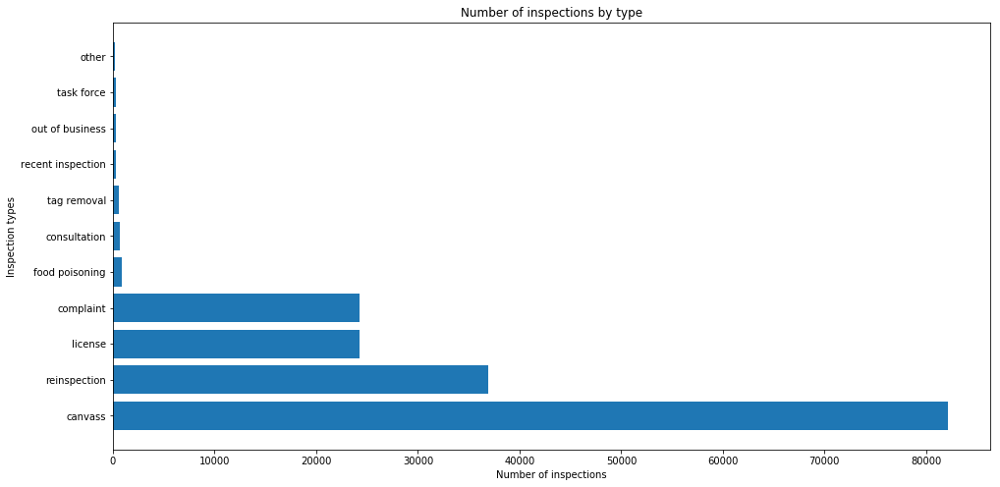

In [81]:
inspection_count=food["Inspection Type"].value_counts()
fig ,ax=plt.subplots(figsize=(16,8))
ax.set_title("Number of inspections by type")
ax.set_xlabel("Number of inspections")
ax.set_ylabel("Inspection types")
_=ax.barh(inspection_count.index,inspection_count.values)

In [82]:
# We count the number pf inspections by type and year
year_inspection_type = pd.DataFrame(food.groupby(['Year','Inspection Type'])['Inspection ID'].count()).reset_index()

year_inspection_type = year_inspection_type.pivot(index='Year', values='Inspection ID', columns='Inspection Type')

year_inspection_type.fillna(0, inplace=True)

year_inspection_type.head()

Inspection Type,canvass,complaint,consultation,food poisoning,license,other,out of business,recent inspection,reinspection,tag removal,task force
Year,,,,,,,,,,,
2010,7002.0,2918.0,236.0,232.0,2707.0,148.0,285.0,22.0,3441.0,260.0,106.0
2011,7548.0,2881.0,136.0,145.0,2643.0,40.0,1.0,20.0,3678.0,331.0,144.0
2012,6844.0,2743.0,74.0,101.0,2744.0,14.0,0.0,2.0,3462.0,6.0,21.0
2013,8835.0,2198.0,60.0,52.0,2554.0,4.0,0.0,12.0,3343.0,3.0,1.0
2014,10108.0,2263.0,72.0,43.0,2374.0,4.0,0.0,31.0,3718.0,2.0,0.0


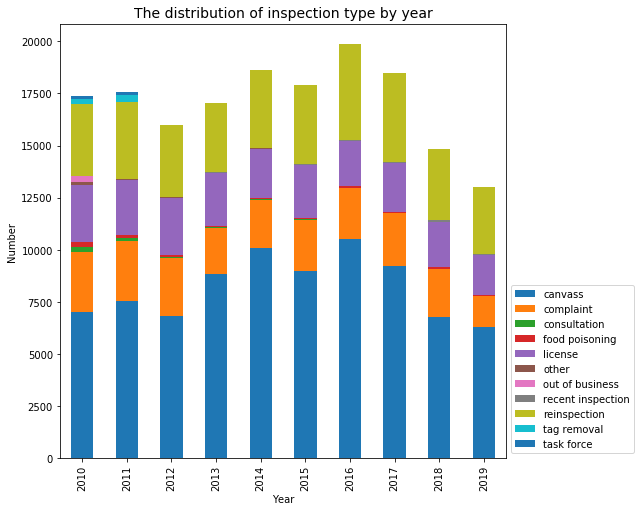

In [83]:
fig, ax = plt.subplots(figsize=(10,10))

year_inspection_type.plot(kind='bar',stacked=True,figsize=(8,8),ax=ax )

plt.legend(loc="lower left", bbox_to_anchor=(1,0))
ax.set_title("The distribution of inspection type by year",size=14)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

plt.show()

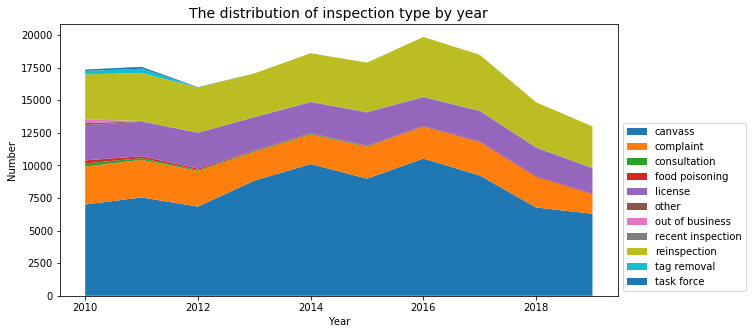

In [84]:
fig, ax = plt.subplots(figsize=(10,5))
                       
plt.stackplot(year_inspection_type.index, year_inspection_type['canvass'], year_inspection_type['complaint'], 
              year_inspection_type['consultation'], year_inspection_type['food poisoning'], year_inspection_type['license'],
              year_inspection_type['other'], year_inspection_type['out of business'], year_inspection_type['recent inspection'], 
              year_inspection_type['reinspection'], year_inspection_type['tag removal'], year_inspection_type['task force'],)

plt.legend(loc="lower left", bbox_to_anchor=(1,0),labels=year_inspection_type.columns)
ax.set_title("The distribution of inspection type by year",size=14)
ax.set_xlabel('Year')
ax.set_ylabel('Number')

plt.show()

We want to focus more on the food poisoning cases: 

#### Food Poisoning

In [85]:
from ipywidgets import interact
food_poisoning_cases= food[food['Inspection Type'] == 'food poisoning']
def plot_(ticker):
    
    fig, ax = plt.subplots(figsize=(10,10))
    
    sns.scatterplot(x='Longitude', y='Latitude', 
                    data=food_poisoning_cases [food_poisoning_cases["Year"]==ticker],ax=ax)
    ax.set_title("The distribution of food poisoning inspection by year",size=20)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('LATITUDE')
    ax.set_ylim([41.6,42.1])
    ax.set_xlim([-88,-87.5])
    
interact(plot_,ticker=widgets.IntSlider(min=2010,max=2019,step=1))


interactive(children=(IntSlider(value=2010, description='ticker', max=2019, min=2010), Output()), _dom_classes…

<function __main__.plot_(ticker)>

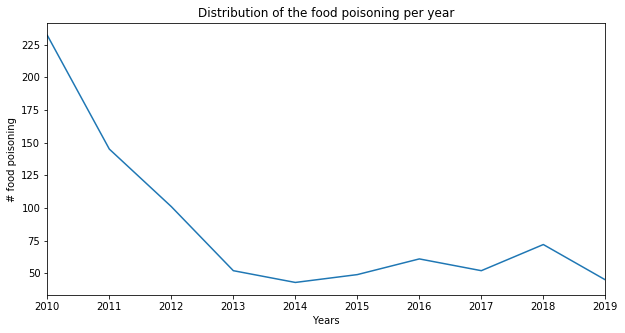

In [86]:
year_inspection_type['food poisoning'].plot(figsize=(10,5))
plt.title("Distribution of the food poisoning per year")
plt.xlabel("Years")
plt.ylabel("# food poisoning")
plt.show()

The number of inspections for food poisoning is interesting and give us some informations.
Indeed, from 2010 to 2014 we observe that while the total number of food inspections increases by a factor of 1.2, 
there is a net decrease (by a factor of 5) of the food poisoning inspections. 

So what did change, several hypohtesis are possible : 
    
    -H0: The detection algorithm improved so that from the number of inspections needed is smaller
    -H1: The inspection had a direct effect and the bad restaurants were closed 

C:\Users\Ridha\Anaconda3\lib\site-packages\pandas\core\series.py:1155: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return self.loc[key]


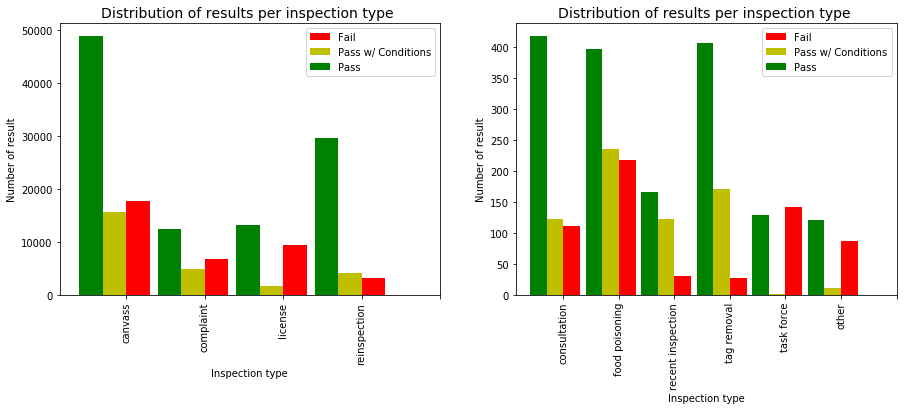

In [87]:
food['Fail'] = food['Results'] == "Fail"
food['Pass'] = food['Results'] == "Pass"
food['Pass w/ Conditions'] =  food['Results'] == "Pass w/ Conditions"

fig = plt.figure(figsize=(15,5))

ax1 = fig.add_subplot(121) 
ax2 = fig.add_subplot(122) 

failures = food.groupby("Inspection Type").sum()['Fail'].copy()
successes = food.groupby("Inspection Type").sum()['Pass'].copy()
condtions = food.groupby("Inspection Type").sum()['Pass w/ Conditions'].copy()

group1 = ['canvass', 'complaint', 'license', 'reinspection','']
group2 = ['consultation' ,'food poisoning', 'recent inspection', 'tag removal', 'task force','other','']

failures[group1].plot(kind ='bar',ax=ax1, color='r',position=0,width=0.3,legend=True)
condtions[group1].plot(kind ='bar', ax=ax1, color='y',position=1,width=0.3,legend=True)
successes[group1].plot(kind ='bar', ax=ax1, color='g',position=2,width=0.3,legend=True)

ax1.set_title("Distribution of results per inspection type ",size=14)
ax1.set_xlabel('Inspection type')
ax1.set_ylabel('Number of result')

failures[group2].plot(kind ='bar',ax=ax2, color='r',position=0,width=0.3,legend=True)
condtions[group2].plot(kind ='bar', ax=ax2, color='y',position=1,width=0.3,legend=True)
successes[group2].plot(kind ='bar', ax=ax2, color='g',position=2,width=0.3,legend=True)

ax2.set_title("Distribution of results per inspection type ",size=14)
ax2.set_xlabel('Inspection type')
ax2.set_ylabel('Number of result')

plt.show()

We are intersted in how food poisoning evolve through time.

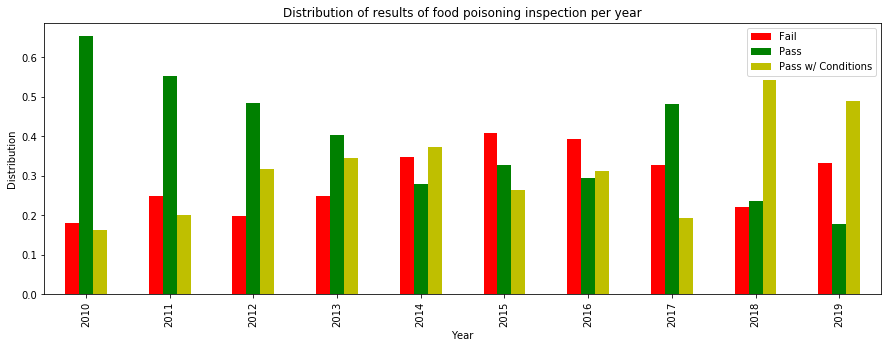

In [88]:
food_poisoning= food[food['Inspection Type'] == 'food poisoning']
categories_food_poisonning= food_poisoning.groupby('Year').sum()[['Fail', 'Pass' , 'Pass w/ Conditions']]
total_numbers= categories_food_poisonning.sum(axis=1)
categories_food_poisonning_norm = categories_food_poisonning/total_numbers.values.reshape((-1,1))

categories_food_poisonning_norm.plot(kind='bar', color= ('r','g', 'y'), figsize = (15,5))
plt.title("Distribution of results of food poisoning inspection per year")
plt.ylabel("Distribution")

plt.show()

### Adress

In [89]:
food["Address"]=food["Address"].str.strip()

### Names

The null values in AKA Name can be replaced with their correspending BDA name

In [90]:
food.loc[food["AKA Name"].isnull(),"AKA Name"] = food.loc[food["AKA Name"].isnull(),"DBA Name"]

In [91]:
# casefold
food["DBA Name"]=food["DBA Name"].str.casefold()
food["AKA Name"]=food["AKA Name"].str.casefold()
# remove anything within paranthesis
food["AKA Name"]=food["AKA Name"].apply(lambda x: re.sub(r'\([^)]*\)', '', x ))
# Let's inspect joint businesses, these have a "/" in their AKA Name
joint=food[["/" in aka for aka in food["AKA Name"]]]["AKA Name"].unique()
joint[0:20]

array(['dunkin donuts/baskin-robbins', 'jewel / osco',
       'south side fuel ctr/dunkin doughnuts',
       'dunkin donuts / baskin robbins', 'catering/main kitchen',
       'dunkin donuts / baskin robins', 'montessori acdy. inft/tod. cnt',
       'kfc/long john silver', 'cvs/pharmacy #2981',
       'italian village / vivere', 'mayne stage/act one cafe',
       'mayne/act one', 'northwest middle/belmont-cragin',
       'legno/suparossa carry out',
       'collins academy/north lawndale college prep', 'am/pm',
       'dunkin  donuts / baskin robbins', 'solo cup co./aramark services',
       'pink monkey / new york strip', "kmart/little caesar's"],
      dtype=object)

In [92]:
# Lots of them are in the form "cvs/pharmacy #xxxxx" so we can fix this 
cvs=food[[aka.startswith("cvs") for aka in food["AKA Name"]]]["AKA Name"].index
food.loc[cvs,"AKA Name"]="cvs"

Let's check if we still have nan values:

In [93]:
null_cols=np.sum(food.isnull() , axis=0)
null_cols[null_cols>0]

Series([], dtype: int64)

# <p style="text-align: center;">Analysing the Yelp Dataset</p>

# <p style="text-align: center;">![Yelp_logo](img/yelp.png)</p>

## 1. Description of the dataset 

[Yelp](https://www.google.com) is a business directory service and crowd-sourced review forum, it focuses on publishing crowd-sourced reviews about businesses. 

To leverage useful data from the Yelp website, we use a combination of [Yelp's API - Yelp Fusion](https://www.yelp.com/fusion) and web scraping in order to get the reviews of the restaurants in Chicago that have been labeled with " food poisoning " during food inspections.

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. Data collection

We started by looking into the public dataset offered by Yelp itself in https://www.yelp.com/dataset but unfortunately it didn't contain info about businesses in Chicago. So we decided to take matters in our hands and extract our own dataset.

We started by getting all the businesses that have been labeled with " food poisoning " during inspections from the Chicago Food Inspection dataset, from that list of businesses we requested the Yelp API Match Endpoint with the name of each business and its address to get the unique Yelp alias of the business. In Yelp every business has both a unique ID, such as `4kMBvIEWPxWkWKFN__8SxQ`, as well as a unique alias, such as `yelp-san-francisco`. Generally, business ID and business alias are interchangeable methods of identifying a Yelp Business. The business alias is more human-readable, but often longer, than the business ID. 

From that previously obtained alias, we query the website for `https://www.yelp.com/biz/alias` to obtain all the reviews of a restaurant. That step is costly in terms of time spent since it is easy to get blacklisted from yelp's website. We use different proxies and user agents to gather our data from the website.

The dataset shown here is just a sample of the entire dataset that we will submit for the next milestone, getting all the reviews we want takes time so for now we will do our analysis on 4130 reviews from 123 restaurants that are affected by food poisoning.

We also analyze the dataset containing said restaurants and information about those according to yelp.

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. Data description

Here is a brief description in each column of the restaurants dataset :

| Name           | Type   | Description                                                              |
|----------------|--------|--------------------------------------------------------------------------|
| Address        | String | Address of the establishment according to our food inspection dataset    |
| Lincense #     | int    | License number of the establishment according to food inspection dataset |
| Name           | String | Name of the establishment                                                |
| alias          | String | Unique Yelp alias of this business.                                      |
| id             | String | Unique Yelp id of this business                                          |
| is_closed      | bool   | Wether the business has been (permanently) closed                        |
| overall_rating | float  | Rating for this business (value ranges from 1, 1.5, ... 4.5, 5).         |
| price          | string | Price level of the business. Value is one of `$` , `$$`, `$$$`,  `$$$$`          |
| review_count   | int    | Number of reviews for this business.                                     |


The columns for the review dataset is pretty self explanatory, it contains the body of the review, the author of the review, the date for when the review was issued, the rating of the restaurant and a unique identifier for the restaurant ( alias ).



## 2. Loading the data

In [205]:
# all useful imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS # this module is for making wordcloud in python
import re # regular expression
import string # for finding punctuation in text
import nltk # preprocessing text
from collections import Counter 
from textblob import TextBlob

ModuleNotFoundError: No module named 'textblob'

In [ ]:
#Import dataset from previously obtained CSV file
restaurants_food_poisoning_reviews = pd.read_csv("data/sample_food_poisoning.csv",index_col=0).drop_duplicates()
restaurants_food_poisoning_reviews.head()

In [ ]:
#Shape of the dataset
restaurants_food_poisoning_reviews.shape

In [ ]:
# Importing second dataset including info about the restaurants without the reviews
restaurants_food_poisoning = pd.read_csv("data/restaurant_aliases_food_poisoning_withrating.csv",index_col=0).drop_duplicates()
restaurants_food_poisoning.head()


In [ ]:
#Shape of the dataset
restaurants_food_poisoning.shape

## 2. Cleaning the data

In [ ]:
# Extract rating from reviewRating then change the type of the column to int
restaurants_food_poisoning_reviews["reviewRating"]=restaurants_food_poisoning_reviews["reviewRating"].str.extract('(\d+)')
restaurants_food_poisoning_reviews = restaurants_food_poisoning_reviews.astype({'reviewRating': 'int32'})
restaurants_food_poisoning_reviews.head()

In [ ]:
restaurants_food_poisoning_reviews.dtypes

In [ ]:
# We check for null values in columns
restaurants_food_poisoning_reviews.columns[restaurants_food_poisoning_reviews.isnull().any()].tolist()

In [ ]:
# We check for empty strings
restaurants_food_poisoning_reviews.columns[(restaurants_food_poisoning_reviews=='').any()].tolist()

In [ ]:
# now to the restaurants info dataset 
restaurants_food_poisoning.dtypes

In [ ]:
# We check for null values in columns
restaurants_food_poisoning.columns[restaurants_food_poisoning.isnull().any()].tolist()

In [ ]:
# To deal with the missing values in price we later plot a distribution over the price variable and then decide what do we set it

In [ ]:
# We check for empty strings
restaurants_food_poisoning.columns[(restaurants_food_poisoning=='').any()].tolist()

In [ ]:
# The id column was only useful for the yelp part, aliases are already a unique identifier and easier to read so we get rid of it
restaurants_food_poisoning = restaurants_food_poisoning.drop(['id'],axis = 1)

In [ ]:
# replace dollar sign to get data that can be parsed because dollar signs cause problems in strings
restaurants_food_poisoning = restaurants_food_poisoning.astype({'price': 'str'})
restaurants_food_poisoning['price'] = restaurants_food_poisoning['price'].str.replace('$', '\$')

## 3. Understanding what's in the data

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. Distributions

In [ ]:
# We get the distribution of reviews over the years
restaurants_food_poisoning_reviews['year_of_review'] = restaurants_food_poisoning_reviews.datePublished.map(lambda x : int(x[:4]))

In [ ]:
# Plotting the distribution of the reviews over the years
plt.figure(figsize=(10, 5))
p = sns.countplot(data = restaurants_food_poisoning_reviews, y = 'year_of_review', orient="h").invert_yaxis()
plt.title("Distribution of the reviews over the years",fontsize=15)
plt.xlabel('Reviews count',fontsize=15)
plt.ylabel('Year of the reviews publishment',fontsize=15);

In [ ]:
# We analyse bad ratings of reviews by getting the restaurants with most bad rating scores. As we work on a sample
# of the data, reviews counts may be lower for some restaurants.
ratings = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews.reviewRating == 1].groupby(['alias', 'reviewRating']).agg('size').to_frame('count').reset_index().sort_values(by='count', ascending=False)
ratings[:20]

In [ ]:
plt.figure(figsize=(10, 5))
#p = sns.barplot(x ='alias', y = 'count', data = ratings[:10], orient="h").invert_yaxis();
p = sns.barplot(data = ratings[:20], x='count', y = 'alias', orient="h")
plt.title("Names of business with the most One Star Reviews",fontsize=15)
plt.xlabel('count of One Star reviews',fontsize=15)
plt.ylabel('Alias of restaurant',fontsize=15);

This plot shows the names of business from the Yelp reviews sample with the most One Star Reviews. Since we are handling a sample, we unfortunately didn't get a clearer ranking in terms of number of One Star Reviews since the number of reviews we have so far is limited. This plot would be more significant when we will work with the entire dataset.

In [ ]:
# Now for the restaurants info dataset
# Since the price column contains dollars, we are going to change dollar signs to integers
restaurants_food_poisoning['price'].unique()

In [ ]:
# Plotting the distribution of the price range by business
dat = restaurants_food_poisoning.groupby(['price']).agg('size').to_frame('count').reset_index()
ax = sns.barplot(x="price",y="count", data=dat)
plt.title("Distribution of the price range by business",fontsize=15)
plt.xlabel('Price range',fontsize=15)
plt.ylabel('Businesses_count',fontsize=15);

Here we can see from our sample that the data is right skewed , the restaurants that fail food inspections for food poisoning are more likely to be cheap

In [ ]:
# We replace the nans of the price range with the most reprensented value $$
# this can change when we get the whole dataset 
restaurants_food_poisoning['price'] = restaurants_food_poisoning['price'].replace('nan', '\$\$', regex=True)

In [ ]:
# Plotting the distribution of the overall_ratings by business
dat = restaurants_food_poisoning.groupby(['overall_rating']).agg('size').to_frame('count').reset_index()
ax = sns.barplot(x="overall_rating",y="count", data=dat)
plt.title("Distribution of the overall ratings by business",fontsize=15)
plt.xlabel('Overall ratings',fontsize=15)
plt.ylabel('Businesses_count',fontsize=15);

We can see here that the ratings are left skewed, so restaurants still have good grades despite having had food poisoning

In [ ]:
# Plotting the distribution of the overall_ratings by business
dat = restaurants_food_poisoning.groupby(['is_closed']).agg('size').to_frame('count').reset_index()
ax = sns.barplot(x="is_closed",y="count", data=dat)
plt.title("Distribution of the permanently closed businesses",fontsize=15)
plt.xlabel('is_closed ',fontsize=15)
plt.ylabel('Businesses_count',fontsize=15);

 Here 0 means that the restaurant is currently opened and 1 means that the restaurant is permanently closed, we can clearly see from this sample 
that the restaurants that faced food inspections and failed for food poisoning have a high chance of being closed permanently today

In [ ]:
# Plotting the distribution of the overall number of reviews by business
plt.figure(figsize=(4, 8))
sns.boxplot(restaurants_food_poisoning.review_count, 
 orient='v', color='#F6A6A0')
plt.ylabel('Number of reviews per busniness')
plt.title("Distribution of the overall number of reviews per business");

Here we see that most of the restaurants have between 50 and 200 reviews

In [ ]:
# We plot the top 10 businesses by number of overall reviews
restaurants_food_poisoning.sort_values(by='review_count', ascending=False)

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. Correlations

In [ ]:
# Correlation between variables in the restaurants dataset
restaurants_food_poisoning[['is_closed','overall_rating','review_count']].corr()

In [ ]:
# Plotting the heatmap.
plt.figure(figsize=(5,5))
ax = sns.heatmap(restaurants_food_poisoning[['is_closed','overall_rating','review_count']].corr(), annot=True, fmt=".2f", cmap = "coolwarm")

# This is a small fix to have the heatmap not be cropped on the top and bottom parts.
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
ax.set_title('Heatmap of the correlation between variables in the restaurants dataset.')

ax;

Here we see that the correlation between variables stays relatively low, even though we can see that the higher the review_count is the higher the overall_rating for that restaurant is which makes sense since popular restaurants normally are popular for a "reason" so they may serve at least decent food. We also see that the restaurant that the fact that a restaurant has bad overall rating affects if a restaurant is closed or not.

## 4. Enriching, filtering, transforming the data according to your needs.

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. Enriching the data

##### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;  - Detecting the language of reviews

In [ ]:
# We detect the language of the reviews for the coming text analysis
from langdetect import detect
restaurants_food_poisoning_reviews["language"] = restaurants_food_poisoning_reviews.description.map(lambda x: detect(x))

In [ ]:
# We see that there are to languages, English and Spanish, we delve further to see what comments were actually said in spanish
restaurants_food_poisoning_reviews["language"].unique()

In [ ]:
restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews["language"] == 'es']['description'].iloc[0]

In [ ]:
# We see that we only have one review in spanish for this sample, thus we just choose to ignore it for now when we do further text processing
# For the next milestone, when we have complete data, if we see that the numbear of reviews in languages other than english is significant
# we will treat them accordingly, by doing a specific preprocessing to each language according to their respective stopwords and 
# study the relationship between words in all languages.
# For now we focus on the english language since it is difficult to leverage useful data from only one review

restaurants_food_poisoining = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews["language"] == 'en']

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. Transforming the text in reviews to remove noise

In [ ]:
# Introduce a preprocessing function to get rid of stopwords in the description of reviews
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())                  # get rid of noise
    x = [w for w in x.split() if w not in set(stopwords)]  # remove stopwords
    return ' '.join(x) # then join the text again

In [ ]:
#Constructing a list of stopwords

#download all stopwords from the nltk library
nltk.download('stopwords')

#get a list of all english stopwords
i = nltk.corpus.stopwords.words('english')

#get a list of all punctuations
j = list(string.punctuation)

stopwords = set(i).union(j)

In [ ]:
# filter the column description according to the stopwords 
restaurants_food_poisoning_reviews["description_filtered"]= restaurants_food_poisoning_reviews.apply(lambda row : preprocess(row["description"]) , axis = 1)
restaurants_food_poisoning

## 4. Deep dive analysis of two businesses that failed food inspections for food poisoning


### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; a. [BBQ Supply Co restaurant](https://www.yelp.com/biz/bbq-supply-chicago-3)

In [ ]:
# Get all the reviews of BBQ Supply CO restaurant
bbq_reviews  = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews.alias == 'bbq-supply-chicago-3']
bbq_reviews.head()

We make a word cloud of BBQ Supply Co restaurant reviews to have an idea about most used words over the reviews

In [ ]:
wc = WordCloud(background_color="white",width=1600, height=800, random_state=1, max_words=200)
# Join all strings together from the filtered description column to obtain all review text for the restaurant
wc.generate(' '.join(bbq_reviews['description_filtered']))


plt.figure(figsize=(15,10))
# Add title to figure
plt.title("BBQ Supply Co restaurant reviews", fontsize=40)
plt.imshow(wc)
plt.axis('off')
plt.tight_layout(pad=10)

In [ ]:
# We get the 20 most occuring words over the reviews. 

# Pass the split_it list to instance of Counter class. 
splitted = bbq_reviews['description_filtered'].apply(lambda x: x.split()).to_list()
flatten = [item for sublist in splitted for item in sublist]
counter = Counter(flatten) 
  
# most_common() produces k frequently encountered 
# input values and their respective counts. 
most_occur = counter.most_common(20) 
most_occur

Conclusion ==> 

When inspecting the word cloud, we can see some negative words like bad, wrong and disappointed. The 20 most occuring words show us no sign of negative reviews nor food poisoning.

In order to have a sharper view on bad reviews, we make a sentiment analysis over reviews.

Sentiment analysis is the process of computationally identifying and categorizing opinions expressed in a text. Especially we apply this process on our reviews in order to determine whether the writer’s attitude towards a restaurant's service is positive, negative, or neutral. 

In [ ]:
#Now we add a column which has the sentiment values of the each review posted for BBQ Supply Co, to see how the 
#author of this review feels about the restaurant.

#Create Text Blob Object and draw out the sentiment of each review by returning a value between -1.0 (extreme negative) 
#and 1.0 (extreme positive).
bbq_reviews['sentiment_analysis'] = bbq_reviews['description_filtered'].apply(lambda x: TextBlob(x).sentiment.polarity)
bbq_reviews = bbq_reviews.sort_values(by='sentiment_analysis', ascending=True)
bbq_reviews[:10]

Here is the first top 5 most negative reviews to BBQ Supply Co restaurant : 
    
    o I just received delivery of a pulled pork sandwich and Mac 'n' cheese ... One minute after eating it I promptly vomited. All I could taste was liquid smoke.  I threw the rest of my lunch. Disgusting.
    
    o Tried to order from here. They cancelled my order in store for no reason. I called and they said they could re-take it but the money I paid for with my card is already gone, waiting 3-5 business days for a refund, that's stupid.
    
    o Literally the worst bbq and worst service at a restaurant I\'ve ever had. Let me start by saying I love smoked bbq. I\'ve eaten at dozens of bbq restaurants over the country and have smoked my own meat as well. I\'m no expert at bbq but I definitely enjoying eating it. However, the food here tasted like cigarette smoke - not bbq smoke. I couldn\'t swallow or even stand the smell of this ashtray food. The worst part of the whole experience is that when I complained to the server about the food she said "there\'s nothing wrong with that food". I told her it\'s awful and won\'t eat it. She said I didn\'t have to eat it but I would still have to pay for it. After arguing with the manager on duty, they refused to change my bill or offer me something else to eat. I reluctantly paid the bill for food I didn\'t eat (left it on the table with only about 4 bites taken) and walked out hungry. I\'ve never experienced such ignorance from a business. Definitely will not return.
    
    o Fatty Brisket with no flavor. St. Louis cut poor flavor. What do they have against salt. Over priced, over rated and typical White folks BBQ. If Bubba ain't on the pit or seasoning the  meat then Bye. If anyone in the Kitchen have no roots past Virginia then say hello to average mac, corn bread and any thing else that goes well with BBQ. Another rip off
    
    o Worst BBQ I've ever had.  For a barbecue joint having only St. Louis Style Ribs is a major oversight.  Baby Backs should at least be an option.  I could even forgive the lack of Baby Back Ribs option if the overpriced St. Louis Style Ribs were actually good but they aren't.  I ordered a full slab and was met with ribs that were tasteless and tough as tire rubber.  Bread on the side, which in all other rib shacks equals a slice of white bread, consisted of a sandwich bun.  Seriously?!  Don't look for Fries or anything else needing a deep fryer on the menu either because they lack a deep fryer.  My wife was disappointed in her dry pulled pork sandwich as well.  The BBQ sauces were locked tighter than Fort Knox in their containers and nearly impossible to extricate.  Presentation was poor as well.  The full slab was cut up into individual ribs and placed into a paper holding tray.  No where on the metal tray was there anywhere to discard the rib bones.  They teach cooking classes at Rub as well which shouldn't be allowed considering the quality of their food.  Overall, a very poor example of BBQ.  I suggest Hecky's, Uncle Willy's, or Uncle John's if you want quality ribs in Chicago.
    
    

When reading the first review with -1 sentiment value, we detect a food poisoning sign: 'One minute after eating it I promptly vomited. All I could taste was liquid smoke'. 

### &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; b. [Margaritaville restaurant](https://www.yelp.com/biz/margaritaville-chicago-chicago	)

In [ ]:
# Get all the reviews of BBQ Supply CO restaurant
margaritaville_reviews = restaurants_food_poisoning_reviews[restaurants_food_poisoning_reviews.alias == 'margaritaville-chicago-chicago']
margaritaville_reviews.head()

In [ ]:
wc = WordCloud(background_color="white",width=1600, height=800, random_state=1, max_words=200)
# Join all strings together from the filtered description column to obtain all review text for the restaurant
wc.generate(' '.join(margaritaville_reviews['description_filtered']))


plt.figure(figsize=(15,10))
# Add title to figure
plt.title("Margaritaville restaurant reviews", fontsize=40)
plt.imshow(wc)
plt.axis('off')
plt.tight_layout(pad=10)

In [ ]:
# We get the 20 most occuring words over the reviews. 

# Pass the split_it list to instance of Counter class. 
splitted = margaritaville_reviews['description_filtered'].apply(lambda x: x.split()).to_list()
flatten = [item for sublist in splitted for item in sublist]
counter = Counter(flatten) 
  
# most_common() produces k frequently encountered 
# input values and their respective counts. 
most_occur = counter.most_common(20) 
most_occur

When inspecting the word cloud, we can see some negative words like bad, awful and slow. The 20 most occuring words show us no sign of negative reviews nor food poisoning.

In order to have a sharper view on bad reviews, we make a sentiment analysis over reviews.

In [ ]:
#Now we add a column which has the sentiment values of the each review posted for Margaritaville, to see how the 
#author of this review feels about the restaurant.

#Create Text Blob Object and draw out the sentiment of each review by returning a value between -1.0 (extreme negative) 
#and 1.0 (extreme positive).
margaritaville_reviews['sentiment_analysis'] = margaritaville_reviews['description_filtered'].apply(lambda x: TextBlob(x).sentiment.polarity)
margaritaville_reviews = margaritaville_reviews.sort_values(by='sentiment_analysis', ascending=True)
margaritaville_reviews[:10]

Let's look at those reviews and detect those related to food poisoning

   o Grabbed a takeout order tonight on a Friday, place was dead and every employee was a joke. Took 20 mins for 2 veggie tacos and employees were dying laughing about how they unplugged the GrubHub device and all the GrubHub orders we're calling the phone to get refunds and they would hang up and cuss them out. Food was subpar. 3 people working on Friday night for a place that can probably seat 50 people. Unsurprisingly they had 4 customers. Shame on me for even trying the place.
     
   o I almost passed out eating here when **I found a bug INSIDE my steak taco** ... the chicken tacos were really dry and bland. The steak was good but omg the fact that **something was crawling inside it**.

    
   o Bland. Customer service needs work. Offensive patrons. **My chips and salsa was served in a ziplock bag** . A generic one...
     
   o Steak burrito ruined my day, stay away!  Not the worst **food poisoning** I've ever had but pretty **bad**.  Wouldn't come back ever.
     
   o Useless. This place used to be great. Now they don't answer their phone, their message box is full, and their employees don't know how to operate the credit card machine. Why bother...
     
     
   o I literally live right across the street and I would rather get in my car and go get tacos or not eat them at all. Way over priced for what you get and they aren't even good. I wouldn't even pay 1 dollar for them let alone almost 4 dollars. Insane.
     
     
   o As I am sitting here **disgusted** by what I jut consumed. The order of nachos without meat, intentionally I did not order meat to avoid the extra heavy feeling after eating. 
     My order consisted of a massive order of chips, black beans, salsa, shredded cheese, a corner of sour cream & sliced avocado per my request & jalapeños. Flavorless is the biggest disappointment, beans no flavor, Salsa no flavor. I would not have enjoyed this if I was hung over. 
     I came here per recommendation from a business down the street that was servicing my car. Never again. 
     As people were walking in to order food, I wanted to ask, "what are you eating here & what does it taste like?".
     I was actually headed to The Girl & Goat Diner, but came here out of convenience. I know next time.


Conclusion : 
    
For further work we will construct our own dictionary of words related to food poisoning, that allow us easily pinpoint reviews that may show us signs of food poisoning in a restaurant.

## Informed Plan

### Food Chain investigation

**Are food chains in different areas more prone to food inspections failure than the same food chains in other areas ?**

To answer this question, we will analyze the geoographical distribution of risk, types of inspection, inpection result and violation type.
We have shown that this is possible to do as we did it for the entire data and we want to do this now for the specific case of food chains in order to conclude whether these characteristics change depending on location within the same food chain. 

### Chicago Tribune article

**Can we assess how real Chicago Tribune's critics are ?**

To answer this question, first we will seperate the establishments by risk category and then we will observe the frequency of inspections and how the inspection's result impact the next inspection.Secondly, we will look at whether there has been a notable change in the inspection behavior past the article publication's date.
The article asks an important question "Does Chicago need more inspectors or more realisitc rules ?". Therefore, we will try to answer this question by comparing the impact of the frequency of the previous investigation and the previous violation assigned on the next result.
For the inspections' frequency we can see by how much the probabilty of a complaint or food poisonning investigation changes with the time interval between inspections.
For the "rules" criteria we can look at the most commun reported violations in passed inspections before a business fails and assess how critical their impact is.

### Food chains

In [94]:
food[food["DBA Name"]=="subway"]["AKA Name"].unique()

array(['subway'], dtype=object)

In [95]:
food[food["AKA Name"]=="subway"]["DBA Name"].unique()

array(['subway sandwiches and salads', 'subway', 'subway store  # 25458',
       'subway sandwiches & salads', 'subway  5183', 'subway 14641',
       'the great state fare', 'c-k subway', 'subway 26199',
       'subway-sandwich', 'subway #44541', 'subway sandwich & salads',
       'sub way', 'sandwich & salad', 'subway sandwiches',
       'subway sandwich shop', 'subway restaurant',
       'subway sandwich & salad', 'subway # 26817-309 w. monroe',
       'subway / tcby', 'subway 7709', 'subway 1121', 'subway #25073',
       'subway 3634', 'subway sandwich and salads', 'subway store #30969',
       'subway 10266', 'skyhigh-101', 'subway sanwich shop',
       'subway #51581', 'subway  #38326', 'subway subs and salads',
       'subway sandwiches and salad', 'subway 50886',
       'subway sandwiches & salad', 'subway restaurant #35406',
       'subway 25064', 'lincoln ave subway', 'subway 275',
       'subway at norwegian american hospital', 'subway #4267',
       'subway sandwich', 'subwa

In [96]:
food[food["AKA Name"]=="mcdonalds"]["DBA Name"].unique()

array(['mcdonalds', 'mcdonalds restaurant', 'pma mcd inc', "mcdonald's",
       'mcdonalds restaurant # 14173', "hale family mcdonald's",
       'mcdonalds #335'], dtype=object)

In [97]:
food[food["DBA Name"]=="mcdonalds"]["AKA Name"].unique()

array(['mcdonalds', 'mc donalds', "mcdonald's", 'mcdonalds  '],
      dtype=object)

From these examples we can see that it is easier to identify food chains' establishments by their AKA Name

In [98]:
# remove punctuation
food["DBA Name"]=food["DBA Name"].str.replace(r'[^\w\s]+', '')
food["AKA Name"]=food["AKA Name"].str.replace(r'[^\w\s]+', '')
# One of our goals is to investigate food chains, so we'll try to group them according to their AKA Name
# Hardcode formatting for food chains
food["AKA Name"]=food["AKA Name"].str.replace("kentucky fried chicken", 'kfc')
food["AKA Name"]=food["AKA Name"].str.replace("mc donalds","mcdonalds")
food["AKA Name"]=food["AKA Name"].str.replace("mcdonalds restaurant","mcdonalds")
food["AKA Name"]=food["AKA Name"].str.replace("dominos pizza","dominos")
food["AKA Name"]=food["AKA Name"].str.replace("subway sandwiches","subway")
food["AKA Name"]=food["AKA Name"].str.replace("chipotle mexican grill","chipotle")
food["AKA Name"]=food["AKA Name"].str.replace("potbelly sandwich works", "potbelly")
food["AKA Name"]=food["AKA Name"].str.replace("potbelly sandwich works llc", "potbelly")
food["AKA Name"]=food["AKA Name"].str.replace("whole foods market","whole foods")
food["AKA Name"]=food["AKA Name"].str.replace("7eleven","7 eleven")
food["AKA Name"]=food["AKA Name"].str.replace("j  j fish","jj fish  chicken")
food["AKA Name"]=food["AKA Name"].str.replace("quiznos sub","quiznos")
food["AKA Name"]=food["AKA Name"].str.replace("starbucks coffee","starbucks")
food["AKA Name"]=food["AKA Name"].str.replace("donutsbaskin","donuts baskin")


food["AKA Name"]=food["AKA Name"].str.title()
food["AKA Name"]=food["AKA Name"].str.replace(" ","")
food["DBA Name"]=food["DBA Name"].str.strip()

We can't talk about food in Chicago without mentionning their deep dish pizza, and namely two of their most famous venues: **Giordano's** and **Lou Malnati's** . So let's add them

In [99]:
food[["Malnati" in aka for aka in food["AKA Name"]]]["AKA Name"].unique()


array(['LouMalnatisPizzeria', 'LouMalnatis'], dtype=object)

In [100]:
food["AKA Name"]=food["AKA Name"].str.replace('LouMalnatisPizzeria', 'LouMalnatis')

In [101]:
giordanos=food[["Giordano" in aka for aka in food["AKA Name"]]].index
food.loc[giordanos,"AKA Name"]="Giordanos"

In [102]:
# We look at establishments with the same AKA name and different adresses
food_chains=food.groupby("AKA Name").Address.nunique().sort_values(ascending=False)
# We will retain food chains with 10 or more establishments
food_chains=food_chains[food_chains>10]
#food_chains[food_chains<10].head(20)
food_chains

AKA Name
Subway                       280
DunkinDonuts                 159
7Eleven                      110
Mcdonalds                    108
Starbucks                    101
Citgo                         72
DunkinDonutsBaskinRobbins     69
Cvs                           69
JimmyJohns                    42
Walgreens                     42
BurgerKing                    42
Marathon                      41
Bp                            34
Chipotle                      33
DollarTree                    33
GatewayNewstand               31
Kfc                           31
Dominos                       30
FamilyDollar                  29
HaroldsChicken                26
Potbelly                      26
PizzaHut                      26
TacoBell                      26
Wendys                        26
Freshii                       23
Wingstop                      22
AuBonPain                     21
JjFishChicken                 21
Shell                         21
Giordanos                     21
H

In [103]:
from sklearn.metrics.pairwise import euclidean_distances
# We are interested in food chains that are rather spread out across the city, for that we will assess the pairwise
# distances of establishments within the same food chain
def food_chain_spread(food_chain):
    location=food[food["AKA Name"]==food_chain][["Latitude","Longitude"]]
    dist_mat=euclidean_distances(location,location)
    return np.sum(dist_mat)/(len(location))
food_chain_spread("Subway")

439.2312269264341

In [104]:
spread=pd.Series(food_chains.index).apply(lambda x: food_chain_spread(x))

In [105]:
fc=pd.DataFrame({"Food_chain":food_chains.index,"number_of_establishments":food_chains.values,"spread":spread})

In [106]:
fc.sort_values("spread", ascending=False).head(10)

,Food_chain,number_of_establishments,spread
0,Subway,280,439.231227
3,Mcdonalds,108,283.523631
1,DunkinDonuts,159,156.362202
2,7Eleven,110,100.656539
4,Starbucks,101,100.645134
6,DunkinDonutsBaskinRobbins,69,85.215568
10,BurgerKing,42,50.560232
23,Wendys,26,45.364857
16,Kfc,31,44.902593
13,Chipotle,33,40.654227


Unsuprisingly, fast food chains dominate the list

In [107]:
df_food_chain = pd.DataFrame(columns=['AKA Name','Zip'])

In [108]:
for foodchain in fc['Food_chain']:
    places = food[food['AKA Name'] == foodchain]
    df_food_chain = df_food_chain.append(places[['AKA Name','Zip']],ignore_index=False)

In [109]:
df_food_chain.rename({'AKA name': 'Food Chain'},inplace=True)
df_food_chain

,AKA Name,Zip
195639,Subway,60614.0
195696,Subway,60628.0
195615,Subway,60613.0
195541,Subway,60622.0
195491,Subway,60623.0
...,...,...
12752,ProteinBar,60654.0
8157,ProteinBar,60614.0
4153,ProteinBar,60606.0
4038,ProteinBar,60601.0


We want to know for each food chain the number of inspections done.

In [110]:
inspections_count_grouped = food.groupby("AKA Name")['Inspection Type'].count()

In [111]:
fc['Number of inspections'] = fc['Food_chain'].map(lambda x: inspections_count_grouped[x])

In [112]:
inspections_fail_grouped = food.groupby("AKA Name")['Fail'].sum()
inspections_pass_grouped = food.groupby("AKA Name")['Pass'].sum()
inspections_pwc_grouped = food.groupby("AKA Name")['Pass w/ Conditions'].sum()

fc['Number of passed inspections'] = fc['Food_chain'].map(lambda x: int(inspections_pass_grouped[x]))
fc['Number of passed w/c inspections'] = fc['Food_chain'].map(lambda x: int(inspections_pwc_grouped[x]))
fc['Number of failed inspections'] = fc['Food_chain'].map(lambda x: int(inspections_fail_grouped[x]))

In [113]:
fc.head()

,Food_chain,number_of_establishments,spread,Number of inspections,Number of passed inspections,Number of passed w/c inspections,Number of failed inspections
0,Subway,280,439.231227,3534,2232,788,514
1,DunkinDonuts,159,156.362202,1405,881,295,229
2,7Eleven,110,100.656539,997,603,205,189
3,Mcdonalds,108,283.523631,1870,1262,258,350
4,Starbucks,101,100.645134,722,524,110,88


We check for each type of inspections per Zip code

In [114]:
zips= food.Zip.unique()

In [115]:
food.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,...,Violation title,Violation comments,Violation score minor,Violation score serious,Violation score critical,Risk number,Inspection Type exact,Fail,Pass,Pass w/ Conditions
195795,52234,cafe 608,Cafe608,2013328.0,restaurant,Risk 1 (High),608 W BARRY AVE,60657.0,2010-01-04,reinspection,...,[None Reported],[],0,0,0,1,License Re-Inspection,False,True,False
195789,67732,wolcotts,Troquet,1992039.0,restaurant,Risk 1 (High),1834 W MONTROSE AVE,60613.0,2010-01-04,reinspection,...,[None Reported],[],0,0,0,1,License Re-Inspection,False,True,False
195790,67733,wolcotts,Troquet,1992040.0,restaurant,Risk 1 (High),1834 W MONTROSE AVE,60613.0,2010-01-04,reinspection,...,[None Reported],[],0,0,0,1,License Re-Inspection,False,True,False
195794,104236,tempo cafe,TempoCafe,80916.0,restaurant,Risk 1 (High),6 E CHESTNUT ST,60611.0,2010-01-04,canvass,...,[NO EVIDENCE OF RODENT OR INSECT OUTER OPENING...,[All necessary control measures shall be used ...,9,2,0,1,Canvass,True,False,False
195792,70269,mrdaniels,Mrdaniels,1899292.0,restaurant,Risk 1 (High),5645 W BELMONT AVE,60634.0,2010-01-04,reinspection,...,[None Reported],[],0,0,0,1,License Re-Inspection,False,True,False


# RIDHA

In [116]:
food_filtered = food[ [name in fc['Food_chain'].values for name in food['AKA Name'] ] ]
food_filtered.head()

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,...,Violation title,Violation comments,Violation score minor,Violation score serious,Violation score critical,Risk number,Inspection Type exact,Fail,Pass,Pass w/ Conditions
195738,58225,whole foods market,WholeFoods,1933690.0,grocery store,Risk 1 (High),1550 N KINGSBURY ST,60642.0,2010-01-05,complaint,...,[FOOD AND NON-FOOD CONTACT SURFACES PROPERLY D...,[All food and non-food contact equipment and u...,4,0,0,1,Complaint,False,True,False
195725,80208,dunkin donuts,DunkinDonuts,2013340.0,restaurant,Risk 1 (High),2800 W Lawrence AVE BLDG,60625.0,2010-01-05,license,...,[NO EVIDENCE OF RODENT OR INSECT OUTER OPENING...,[All necessary control measures shall be used ...,5,3,0,1,License,True,False,False
195752,158243,dunkin donuts,DunkinDonuts,2013344.0,restaurant,Risk 2 (Medium),970 W PERSHING RD,60609.0,2010-01-05,license,...,[None Reported],[],0,0,0,2,License,True,False,False
195734,68251,cvs pharmacy 2935,Cvs,1998048.0,grocery store,Risk 3 (Low),8712 S STONY ISLAND AVE,60617.0,2010-01-05,reinspection,...,[None Reported],[],0,0,0,3,License Re-Inspection,False,True,False
195774,120270,7eleven 32889b,7Eleven,1766212.0,grocery store,Risk 2 (Medium),48 N WELLS ST,60606.0,2010-01-05,complaint,...,[CLEAN MULTI-USE UTENSILS AND SINGLE SERVICE A...,"[Containers and utensils shall be inverted, co...",4,0,0,2,Complaint,False,True,False


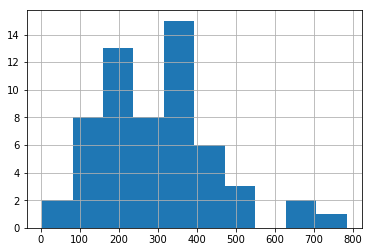

In [117]:
food_filtered.groupby('Zip').count()['License #'].hist()
plt.show()

In [118]:
df_chain_zips= pd.DataFrame(columns = zips)
a=food_filtered.groupby(['AKA Name','Zip'])[['Pass','Fail','Pass w/ Conditions']].sum() 
a = a / a.values.sum(axis=1).reshape((-1,1))
b=food_filtered.groupby(['AKA Name','Zip'])['License #'].nunique()
c= pd.concat([a,b],axis=1)
c

Pass      Fail  Pass w/ Conditions  License #
AKA Name Zip                                                       
7Eleven  60601.0  0.789474  0.105263            0.105263          3
         60602.0  0.523810  0.095238            0.380952          7
         60603.0  0.727273  0.000000            0.272727          5
         60604.0  0.666667  0.166667            0.166667          1
         60605.0  0.764706  0.000000            0.235294          4
...                    ...       ...                 ...        ...
Wingstop 60647.0  0.318182  0.318182            0.363636          3
         60651.0  1.000000  0.000000            0.000000          1
         60652.0  0.666667  0.000000            0.333333          1
         60659.0  0.000000  0.000000            1.000000          1
         60660.0  0.500000  0.000000            0.500000          1

[1005 rows x 4 columns]

In [119]:
c.groupby(level=0).std().head()

,Pass,Fail,Pass w/ Conditions,License #
AKA Name,,,,
7Eleven,0.125309,0.100927,0.109185,5.044799
ArgoTea,0.168187,0.086497,0.150834,1.322876
AuBonPain,0.171210,0.102925,0.095182,1.752920
Bp,0.266520,0.203856,0.240616,1.154701
BurgerKing,0.233919,0.120496,0.208450,0.961321


In [120]:
c.groupby(level=0).mean().head()

,Pass,Fail,Pass w/ Conditions,License #
AKA Name,,,,
7Eleven,0.617186,0.167733,0.215081,6.250000
ArgoTea,0.718147,0.088565,0.193288,1.666667
AuBonPain,0.742376,0.123319,0.134305,2.454545
Bp,0.667931,0.240069,0.092000,1.600000
BurgerKing,0.628713,0.168134,0.203153,1.800000


I will represent the restaurants using graphs !

In [121]:
food_filtered['Inspection Type'].unique()

array(['complaint', 'license', 'reinspection', 'canvass', 'task force',
       'consultation', 'food poisoning', 'other', 'out of business',
       'recent inspection', 'tag removal'], dtype=object)

In [122]:
food_filtered[food_filtered['AKA Name'] == 'Subway'].groupby('License #').Latitude.nunique()

License #
0.0          3
15059.0      1
18236.0      1
20481.0      1
21653.0      1
            ..
2663902.0    1
2665354.0    1
2665377.0    1
2683476.0    1
2689652.0    1
Name: Latitude, Length: 369, dtype: int64

In [123]:
food_filtered[food_filtered["License #"] == 1933690.0]["AKA Name"].unique()[0]

'WholeFoods'

In [124]:
from sklearn.metrics.pairwise import euclidean_distances
# We are interested in food chains that are rather spread out across the city, for that we will assess the pairwise
# distances of establishments within the same food chain
def food_chain_spread(food_chain):
    location=food[food["AKA Name"]==food_chain][["Latitude","Longitude"]]
    dist_mat=euclidean_distances(location,location)
    return np.sum(dist_mat)/(len(location))
food_chain_spread("Subway")

439.2312269264341

In [125]:
from sklearn.metrics.pairwise import euclidean_distances
import networkx as nx
import ipywidgets as widgets

def plot_(ticker_name, ticker_type, ticker_start_year, ticker_end_year, ticker_connection):
    
    
    #Selection on the years, inpection type and food chain's name 
    if(ticker_type == 'All'):
        restaurants =  food_filtered[(food_filtered['Year'] >= ticker_start_year) & (food_filtered['Year'] <= ticker_end_year) 
                                  & (food_filtered['License #'] != 0.0) & (food_filtered['AKA Name'] == ticker_name)].groupby(['License #']) 
    else:
        restaurants =  food_filtered[(food_filtered['Year'] >= ticker_start_year) & (food_filtered['Year'] <= ticker_end_year) 
                                    & (food_filtered['License #'] != 0.0) & (food_filtered['AKA Name'] == ticker_name)
                                    & (food_filtered['Inspection Type'] == ticker_type)].groupby(['License #']) 
    
    #number of inspection done for the size of the nodes
    number_of_inspection = restaurants.count()['Inspection ID']
    
    #Unique value per License#
    restaurants = restaurants[['Longitude','Latitude','Zip', 'Fail','Pass','Pass w/ Conditions', 'Risk number']].mean()
    
    #Addign the name of food Chain
    rest_name = []
    for license_nbre in restaurants.index:
         rest_name.append(food_filtered[food_filtered["License #"] == license_nbre]["AKA Name"].unique()[0])
    
    restaurants['Food Chain'] = rest_name
    
    
    #Creation of the graph and nodes
    G = nx.Graph()
    G.add_nodes_from( range(0,len(restaurants)) )

    #Creation of the edges 
    for index, resto in enumerate(restaurants.values):

        if index != len(restaurants.values)-1:    #because last node does'nt add an edge :) 

            rest_pos = resto[0:2].reshape((-1,2))  #Position of the restaurant
            
            edges = []
            min_distance = 10000
            min_j = index

            for j in range(index+1,len(restaurants) ): 

                #Choice on how to connect the nodes: samme Zip or same FoodChain
                if((ticker_connection == 'Zip code' and restaurants.iloc[index, 2] == restaurants.iloc[j, 2])  
                  or (ticker_connection == 'Food Chain' and restaurants.iloc[index, 7] == restaurants.iloc[j, 7]) ):  
                        
                    other_rest_pos = [ [restaurants.iloc[j, 0 ],restaurants.iloc[j, 1 ]] ] 

                    distance = euclidean_distances(other_rest_pos,rest_pos)

                    if(distance[0,0] < min_distance and distance[0,0] > 0):
                        min_distance = distance[0,0]
                        min_j = j

            if(min_j != index ) :           
                edges.append( (index,min_j,distance) )
                G.add_weighted_edges_from(edges)

    plt.figure(figsize=(8, 8))
    nx.draw(G, node_size=number_of_inspection*50/(ticker_end_year-ticker_start_year +1), pos=restaurants[['Longitude','Latitude']].values ,  node_color = list(restaurants['Pass'].values), cmap=plt.cm.RdYlGn, )  #must change pos 
    plt.title('Probabilty to pass clustered by zip code for the food chain {0} from {1} to {2}'.format(ticker_name,ticker_start_year,ticker_end_year))
    plt.show()

In [126]:
name_fc = widgets.Dropdown(
    options = food_filtered['AKA Name'].unique(),
    value ='Subway',
    description='Food Chain:'
)

inpection_type = widgets.Dropdown(
    options = np.append(food_filtered['Inspection Type'].unique(),'All'),
    value ='All',
    description='Inspection Type :'
)

start_year = widgets.ToggleButtons(
    options=range(2010,2020),
    description='From:',
)
 
end_year = widgets.ToggleButtons(
    options=range(2010,2020),
    description='To:',
)

connection = widgets.RadioButtons(
    options=['Zip code', 'Food Chain'],
    value='Zip code',
    description='Connection:',
)

The size of the nodes evolves with the average annual number of visits

In [127]:
interact(plot_, ticker_name = name_fc, ticker_type = inpection_type,
         ticker_start_year = start_year, ticker_end_year = end_year, ticker_connection = connection)

interactive(children=(Dropdown(description='Food Chain:', index=9, options=('WholeFoods', 'DunkinDonuts', 'Cvs…

<function __main__.plot_(ticker_name, ticker_type, ticker_start_year, ticker_end_year, ticker_connection)>

In [128]:
food_filtered.columns

Index(['Inspection ID', 'DBA Name', 'AKA Name', 'License #', 'Facility Type',
       'Risk', 'Address', 'Zip', 'Inspection Date', 'Inspection Type',
       'Results', 'Violations', 'Latitude', 'Longitude', 'Location', 'Year',
       'Month', 'Day', 'Violation numbers', 'Violation title',
       'Violation comments', 'Violation score minor',
       'Violation score serious', 'Violation score critical', 'Risk number',
       'Inspection Type exact', 'Fail', 'Pass', 'Pass w/ Conditions'],
      dtype='object')

In [136]:
food_filtered['Inspection Type']

195738       complaint
195725         license
195752         license
195734    reinspection
195774       complaint
              ...     
50           complaint
45             license
8            complaint
11        reinspection
12        reinspection
Name: Inspection Type, Length: 17183, dtype: object

#### Distribution of the inspection type results 

In [691]:
def plot_distribution(ticker_name, ticker_start_year, ticker_end_year):
    
    if(ticker_end_year < ticker_start_year):
        return
    
    #select the food chain and year 
    food_filtered_fc_year = food_filtered[(food_filtered['AKA Name'] == ticker_name) &
                                           (food_filtered['Year'] >= ticker_start_year) & (food_filtered['Year'] <=ticker_end_year)]

    fig = plt.figure(figsize=(15,5))

    ax1 = fig.add_subplot(121) 
    ax2 = fig.add_subplot(122) 

    failures = food_filtered_fc_year.groupby("Inspection Type").sum()['Fail'].copy()
    successes = food_filtered_fc_year.groupby("Inspection Type").sum()['Pass'].copy()
    condtions = food_filtered_fc_year.groupby("Inspection Type").sum()['Pass w/ Conditions'].copy()
    
    group1 = ['canvass', 'complaint', 'license', 'reinspection','']
    group2 = ['consultation' ,'food poisoning', 'recent inspection', 'tag removal', 'task force','other','']
    
    for g in (group1+group2):
        if g not in failures.index:
             failures[g] = 0
        if g not in successes.index:
             successes[g] = 0
        if g not in condtions.index:
             condtions[g] = 0
    
    failures[group1].plot(kind ='bar',ax=ax1, color='r',position=0,width=0.3,legend=True)
    condtions[group1].plot(kind ='bar', ax=ax1, color='y',position=1,width=0.3,legend=True)
    successes[group1].plot(kind ='bar', ax=ax1, color='g',position=2,width=0.3,legend=True)

    ax1.set_title("Distribution of results per inspection type ",size=14)
    ax1.set_xlabel('Inspection type')
    ax1.set_ylabel('Number of result')

    failures[group2].plot(kind ='bar',ax=ax2, color='r',position=0,width=0.3,legend=True)
    condtions[group2].plot(kind ='bar', ax=ax2, color='y',position=1,width=0.3,legend=True)
    successes[group2].plot(kind ='bar', ax=ax2, color='g',position=2,width=0.3,legend=True)

    ax2.set_title("Distribution of results per inspection type ",size=14)
    ax2.set_xlabel('Inspection type')
    ax2.set_ylabel('Number of result')

    plt.show()

In [692]:
import plotly.express as px

def plot_radar(ticker_name, ticker_start_year, ticker_end_year):

    if(ticker_end_year < ticker_start_year):
        return
    
    #select the food chain and years
    food_filtered_fc_year = food_filtered[(food_filtered['AKA Name'] == ticker_name) &
                                       (food_filtered['Year'] >= ticker_start_year) & (food_filtered['Year'] <=ticker_end_year)]

    #find the distribution
    distribution= food_filtered_fc_year['Inspection Type'].value_counts()
    df_distribution = pd.DataFrame(dict(violation_type = distribution.index, count = distribution.values) ).sort_values(by=['violation_type'])
    
    fig = px.line_polar(df_distribution, r='count', theta='violation_type', line_close=False)
    fig.update_traces(fill='toself')

    fig.update_layout(
        title={
            'text': 'Inspection for the food chain {0} from {1} to {2}'.format(ticker_name,ticker_start_year,ticker_end_year),
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'})

    fig.show()

In [693]:
name_fc = widgets.Dropdown(
    options = food_filtered['AKA Name'].unique(),
    value ='Subway',
    description='Food Chain:'
)

start_year = widgets.ToggleButtons(
    options=range(2010,2020),
    description='From:',
    value=2010
)
 
end_year = widgets.ToggleButtons(
    options=range(2010,2020),
    description='To:',
    value=2019
)

In [694]:
def plot_(ticker_name, ticker_start_year, ticker_end_year):
    plot_radar(ticker_name, ticker_start_year, ticker_end_year)
    plot_distribution(ticker_name, ticker_start_year, ticker_end_year)

In [695]:
interact(plot_, ticker_name=name_fc, ticker_top=top, ticker_start_year=start_year, ticker_end_year=end_year)

interactive(children=(Dropdown(description='Food Chain:', index=9, options=('WholeFoods', 'DunkinDonuts', 'Cvs…

<function __main__.plot_(ticker_name, ticker_start_year, ticker_end_year)>

In [590]:
def majority(row):
    if((row[0]==0) & (row[1] == 0) & (row[2] == 0)):
        return 'Unknown'
    return row.idxmax()

In [670]:
from collections import OrderedDict
from math import log, sqrt
import numpy as np
import pandas as pd
from six.moves import cStringIO as StringIO
from bokeh.models import Select
from bokeh.plotting import figure, show, output_file
from bokeh.layouts import column

In [689]:
def plot_graph():
    #select the correct dataframe with AKA Name new 
    fc_name = 'Mcdonalds'
    food_filtered_fc_year = food_filtered[(food_filtered['AKA Name'] == fc_name)]
    failures = food_filtered_fc_year.groupby("Inspection Type").sum()['Fail']
    successes = food_filtered_fc_year.groupby("Inspection Type").sum()['Pass']
    conditions = food_filtered_fc_year.groupby("Inspection Type").sum()['Pass w/ Conditions']
    
    df = pd.concat([failures,conditions,successes],axis=1)
    df ['Category'] = df.apply(majority,axis=1)
    df.reset_index(inplace= True)    #df with columns (Inspection Type, Fail, Pass x/ conditons, Pass, Category)
    
    
    #plot
    result_color = OrderedDict([
        ("Fail","red"),
        ("Pass w/ Conditions", "yellow"),
        ("Pass","forestgreen" ),
    ])

    category_color = OrderedDict([
        ("Pass", "limegreen"),
        ("Pass w/ Conditions", "khaki"),
        ("Fail", "lightcoral"),
        ("Unknwon","lightgray")
    ])

    width = 800
    height = 800
    inner_radius = 90
    outer_radius = 300 - 10

    maxr = sqrt(log(1 * 1E4))
    minr = sqrt(log(1000 * 1E4))
    a = (outer_radius - inner_radius) / (minr - maxr)
    b = inner_radius - a * maxr

    def rad(mic):
        return (a * np.sqrt(np.log(mic * 1E4)) + b)

    big_angle = 2.0 * np.pi / (len(df) + 1)
    small_angle = big_angle / 7

    p = figure(plot_width=width, plot_height=height, title="Distribution of inspection type for the food chain {0}".format(fc_name),
        x_axis_type=None, y_axis_type=None,
        x_range=(-420, 420), y_range=(-420, 420),
        min_border=0, outline_line_color="white",
        background_fill_color="#f0e1d2")

    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None

    # annular wedges
    angles = np.pi/2 - big_angle/2 - df.index.to_series()*big_angle
    colors = [category_color[c] for c in df.Category]
    p.annular_wedge(
        0, 0, inner_radius, outer_radius+57, -big_angle+angles, angles, color=colors,
    )

    # small wedges
    p.annular_wedge(0, 0, inner_radius, rad(df.Fail),
                    -big_angle+angles+5*small_angle, -big_angle+angles+6*small_angle,
                    color=result_color['Fail'])
    p.annular_wedge(0, 0, inner_radius, rad(df['Pass w/ Conditions']),
                    -big_angle+angles+3*small_angle, -big_angle+angles+4*small_angle,
                    color=result_color['Pass w/ Conditions'])
    p.annular_wedge(0, 0, inner_radius, rad(df.Pass),
                    -big_angle+angles+1*small_angle, -big_angle+angles+2*small_angle,
                    color=result_color['Pass'])

    # circular axes and lables
    labels = np.power(10.0, np.arange(0, 5))
    radii = a * np.sqrt(np.log(labels * 1E4)) + b
    p.circle(0, 0, radius=radii, fill_color=None, line_color="white")
    p.text(0, radii, [str(r) for r in labels],
           text_font_size="8pt", text_align="center", text_baseline="middle")

    # radial axes
    p.annular_wedge(0, 0, inner_radius, outer_radius+57,
                    -big_angle+angles, -big_angle+angles, color="black")

    # Inspection Type labels
    xr = radii[-1]*np.cos(np.array(-big_angle/2 + angles))
    yr = radii[-1]*np.sin(np.array(-big_angle/2 + angles))
    label_angle=np.array(-big_angle/2+angles)
    label_angle[label_angle < -np.pi/2] += np.pi # easier to read labels on the left side
    p.text(xr, yr, df['Inspection Type'], angle=label_angle,
           text_font_size="12pt", text_align="center", text_baseline="middle")

    # Hand drawn legends 
    p.circle([-40, -40,-40,-40], [-350,-370,-390, -410], color=['limegreen','khaki','lightcoral','lightgray'], radius=5)
    p.text([-30, -30], [-350,-370],  text=["Majority:" + c for c in ['Pass',"Pass w/ Conditions"]],
           text_font_size="7pt", text_align="left", text_baseline="middle")
    p.text([-30, -30], [-390, -410],  text=["Majority:" + c for c in ['Fail',"Unknown"]],
           text_font_size="7pt", text_align="left", text_baseline="middle")

    p.rect([-40, -40, -40], [18, 0, -18], width=30, height=13,
           color=list(result_color.values()))
    p.text([-15, -15, -15], [18, 0, -18], text=list(result_color),
          text_font_size="9pt", text_align="left", text_baseline="middle")
    
    select= Select(title="FooChain", value="Subway",
                    options=food_filtered['AKA Name'].unique().tolist())
    def update(attname,old,new):
        fc_name = new
    
    #select.on_change("value",update)
    layout = column(select, p)

    show(layout)

    return 

In [690]:
plot_graph()

In [678]:
from math import sin
from random import random

from bokeh.io import output_file, show
from bokeh.models import ColumnDataSource, HoverTool, LinearColorMapper
from bokeh.palettes import plasma
from bokeh.plotting import figure
from bokeh.transform import transform

list_x = list(range(100))
list_y = [random() + sin(i / 20) for i in range(100)]
desc = [str(i) for i in list_y]

source = ColumnDataSource(data=dict(x=list_x, y=list_y, desc=desc))
hover = HoverTool(tooltips=[
    ("index", "$index"),
    ("(x,y)", "(@x, @y)"),
    ('desc', '@desc'),
])

mapper = LinearColorMapper(palette=plasma(256), low=min(list_y), high=max(list_y))

p = figure(plot_width=400, plot_height=400, tools=[hover], title="Belgian test")
p.circle('x', 'y', size=10, source=source,
         fill_color=transform('y', mapper))

output_file('test.html')
show(p)

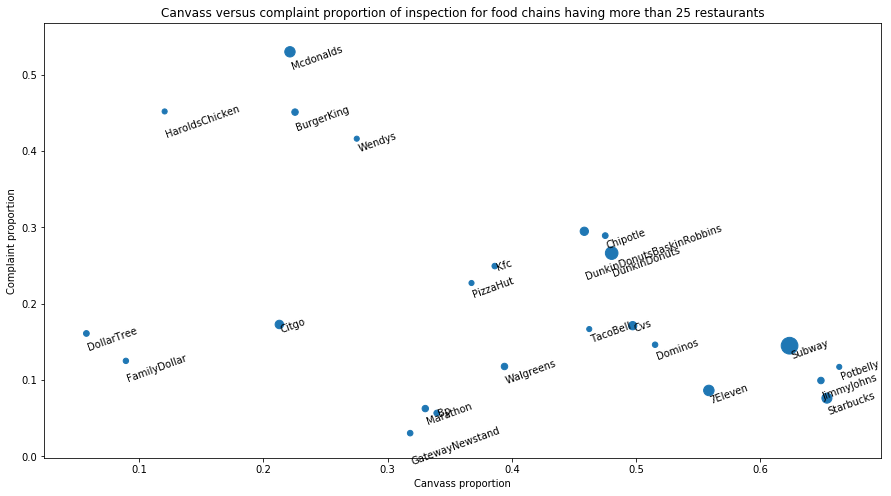

In [509]:
min_resto = 25
canvass = []
complaint = []
number_of_establishments = []
rest_names = []

for name in fc_names:
    number_of_restaurant = food_filtered[food_filtered['AKA Name'] == name]['Address'].nunique()
    if(number_of_restaurant > min_resto ):
        rest_names.append(name)
        sum_= fc_inspectionType_distribtuion[name].sum()
        number_of_restaurant = food_filtered[food_filtered['AKA Name'] == name]['Address'].nunique()

        number_of_establishments.append(number_of_restaurant)

        if('canvass' in fc_inspectionType_distribtuion[name]):
            canvass.append(fc_inspectionType_distribtuion[name]['canvass']/sum_)
        else: 
            canvass.append(0)
        if('complaint' in fc_inspectionType_distribtuion[name]):
            complaint.append(fc_inspectionType_distribtuion[name]['complaint']/sum_)
        else: 
            complaint.append(0)

fig, ax = plt.subplots(figsize=(15,8))
ax.scatter(canvass, complaint, s=number_of_establishments)

for i, txt in enumerate(rest_names):
    ax.annotate(txt, (canvass[i], complaint[i]),rotation=20)

plt.xlabel("Canvass proportion")
plt.ylabel("Complaint proportion")
plt.title("Canvass versus complaint proportion of inspection for food chains having more than {0} restaurants".format(min_resto))
plt.show()

We want to cluster the food chain using k-means. 

In [230]:
food_inspection_failed = food_filtered[(food_filtered['Fail'] == 1) ]
inspection_list = food_inspection_failed['Violation numbers'].sum()
inspection_list = [int(i) for i in inspection_list ] #because they are st

#find the distribution
distribution= pd.Series(inspection_list).value_counts()
df_distribution = pd.DataFrame(dict(violation_nbr = distribution.index, count = distribution.values) ).sort_values(by=['count'], ascending= False)
df_distribution

,violation_nbr,count
0,34,1628
1,33,1256
2,35,1239
3,18,1229
4,38,1164
...,...,...
57,70,8
58,7,7
59,25,5
60,46,3


### Food Poisoning 

In [265]:
food[(food['Inspection Type'] == 'food poisoning') & (food['Fail'] ==1)].groupby('AKA Name')['Inspection ID'].count().sort_values(ascending= False)

AKA Name
Subway                     3
UncleJoesJerkChickenInc    2
CarnivaleRestaurant        2
Qdoba                      2
Mcdonalds490               2
                          ..
NookiesTree                1
MyFairLady                 1
MoreliaSupermarket         1
MontroseDeliFruitMarket    1
3JjjsBetterTasteJamaica    1
Name: Inspection ID, Length: 204, dtype: int64

In [232]:
food[food['Inspection Type'] == 'food poisoning']['Inspection Type exact'].value_counts()

Suspected Food Poisoning        839
SFP/COMPLAINT                     4
SFP                               4
TWO PEOPLE ATE AND GOT SICK.      1
sfp/complaint                     1
POSSIBLE FBI                      1
SFP/Complaint                     1
SFP RECENTLY INSPECTED            1
Name: Inspection Type exact, dtype: int64

In [233]:
food[food['Inspection Type'] == 'food poisoning']['Violation numbers']

195749                                     [32, 33, 35, 36]
195770                                 [32, 33, 34, 35, 41]
195614                                             [32, 34]
195552                                             [34, 42]
195565                                     [33, 34, 38, 41]
                                ...                        
2025                                   [37, 49, 51, 55, 56]
2059      [10, 10, 10, 10, 16, 20, 22, 25, 33, 47, 47, 5...
1601      [10, 22, 25, 36, 37, 38, 41, 48, 51, 53, 54, 5...
954                                                     [0]
104                                                    [37]
Name: Violation numbers, Length: 852, dtype: object

Depending on the results of the inspection we would like to see the disitrbution of the inspections numbers.

*Question*: How does the food poisoning inspection work ? What inspection make you fail ? 

In [234]:
def dist(row):
    for e in row:
        violation_nbre.append(int(e))

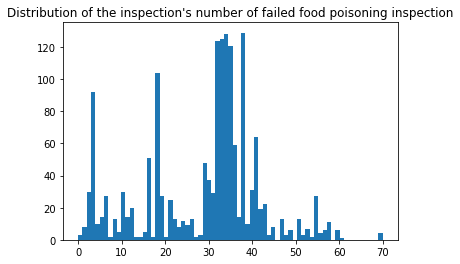

38    129
34    128
33    125
32    124
35    121
Name: 0, dtype: int64

In [267]:
violation_nbre = []
food[(food['Inspection Type'] == 'food poisoning') & (food['Fail'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.title("Distribution of the inspection's number of failed food poisoning inspection")
plt.show()

violation_count_fail= pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_fail.head()

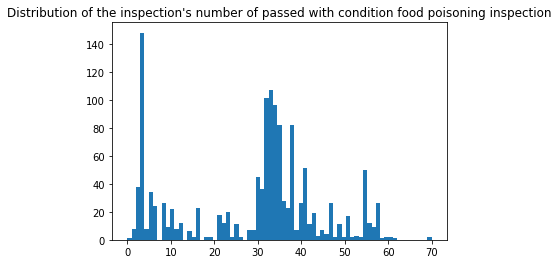

3     148
33    107
32    101
34     96
38     82
Name: 0, dtype: int64

In [270]:
violation_nbre = []

food[(food['Inspection Type'] == 'food poisoning') & (food['Pass w/ Conditions'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.title("Distribution of the inspection's number of passed with condition food poisoning inspection")
plt.show()

violation_count_pass = pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_pass.head()

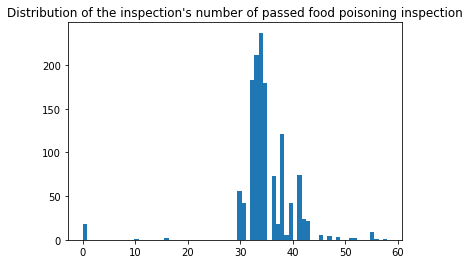

34    237
33    211
32    183
35    179
38    121
Name: 0, dtype: int64

In [269]:
violation_nbre = []

food[(food['Inspection Type'] == 'food poisoning') & (food['Pass'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.title("Distribution of the inspection's number of passed food poisoning inspection")
plt.show()

violation_count_pass = pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_pass.head()

In [277]:
pois_food = food[(food['Inspection Type'] == 'food poisoning')]
visit_before_fp = pd.DataFrame()

for resto in pois_food.values:
    license_nbre = resto[3]
    date = resto[8]
    before = food[(food['License #'] == license_nbre) & (food['Inspection Date'] < date)].sort_values(by='Inspection Date', ascending =False)
    if(len(before) != 0):
        dif_date = date - before.iloc[0][8]
        before['Date dif'] = dif_date
        visit_before_fp = visit_before_fp.append(before.iloc[0])

In [285]:
df_pass_after_month_fp = visit_before_fp[(visit_before_fp['Date dif'] < '30 days') & (visit_before_fp['Pass'] == 1)] 

In [300]:
df_pass_after_month_fp[['AKA Name','Address']]

,AKA Name,Address
195560,MiaFrancesca,3311 N CLARK ST
195503,ILoveSushi,233 N MICHIGAN AVE
195660,ChurchsChicken478,101 E 35TH ST
194828,SuCasa,49 E ONTARIO ST
194377,Subway,5240 N PULASKI RD
...,...,...
56479,PapisTacos,2320 W TAYLOR ST
46977,LaTapenade,11601 W TOUHY AVE
31562,LawrenceFishMarket,3914 W LAWRENCE AVE
28011,PandaExpress,2949 W ADDISON AVE


In [241]:
titles = list()
for e in visit_before_fp['Violation title'].values:
    titles = titles+e

In [242]:
df_title= pd.DataFrame(titles)
df_title[0].value_counts().head(20)

FLOORS: CONSTRUCTED PER CODE, CLEANED, GOOD REPAIR, COVING INSTALLED, DUST-LESS CLEANING METHODS USED                      326
FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSILS CLEAN, FREE OF ABRASIVE DETERGENTS                                            294
WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTRUCTED PER CODE: GOOD REPAIR, SURFACES CLEAN AND DUST-LESS CLEANING METHODS       279
FOOD AND NON-FOOD CONTACT SURFACES PROPERLY DESIGNED, CONSTRUCTED AND MAINTAINED                                           260
VENTILATION: ROOMS AND EQUIPMENT VENTED AS REQUIRED: PLUMBING: INSTALLED AND MAINTAINED                                    224
PREMISES MAINTAINED FREE OF LITTER, UNNECESSARY ARTICLES, CLEANING  EQUIPMENT PROPERLY STORED                              122
None Reported                                                                                                              116
LIGHTING: REQUIRED MINIMUM FOOT-CANDLES OF LIGHT PROVIDED, FIXTURES SHIELDED                                   

In [243]:
df_title[ [('FOOD' in title) or ('TEMPERATURE' in title) for title in df_title[0]] ][0].value_counts().head(20)

FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSILS CLEAN, FREE OF ABRASIVE DETERGENTS                                     294
FOOD AND NON-FOOD CONTACT SURFACES PROPERLY DESIGNED, CONSTRUCTED AND MAINTAINED                                    260
FOOD IN ORIGINAL CONTAINER, PROPERLY LABELED: CUSTOMER ADVISORY POSTED AS NEEDED                                     98
FOOD (ICE) DISPENSING UTENSILS, WASH CLOTHS PROPERLY STORED                                                          42
POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATURE REQUIREMENT DURING STORAGE, PREPARATION DISPLAY AND SERVICE             32
MANAGEMENT, FOOD EMPLOYEE AND CONDITIONAL EMPLOYEE; KNOWLEDGE, RESPONSIBILITIES AND REPORTING                        30
FOOD HANDLER REQUIREMENTS MET                                                                                        23
* CERTIFIED FOOD MANAGER ON SITE WHEN POTENTIALLY HAZARDOUS FOODS ARE  PREPARED AND SERVED                           21
FOOD & NON-FOOD CONTACT SURFACES CLEANAB

In [244]:
visit_before_fp['Inspection Type'].value_counts()

canvass              295
reinspection         173
complaint            165
license               32
food poisoning        27
tag removal            5
consultation           4
other                  3
recent inspection      2
Name: Inspection Type, dtype: int64

In [245]:
food['Inspection Type'].value_counts()

canvass              82164
reinspection         36874
license              24226
complaint            24224
food poisoning         852
consultation           652
tag removal            605
recent inspection      321
out of business        286
task force             272
other                  220
Name: Inspection Type, dtype: int64

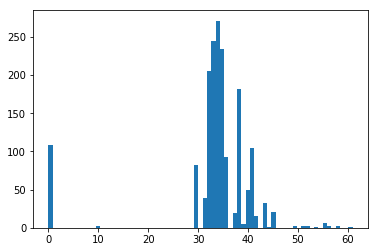

34    271
33    244
35    234
32    205
38    182
Name: 0, dtype: int64

In [246]:
violation_nbre = []

visit_before_fp[(visit_before_fp['Pass'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.show()

violation_count_pass = pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_pass.head()

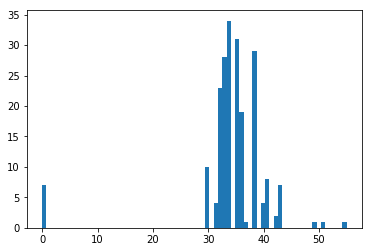

34    34
35    31
38    29
33    28
32    23
Name: 0, dtype: int64

In [247]:
violation_nbre = []

visit_before_fp[(visit_before_fp['Date dif'] < '30 days') & (visit_before_fp['Pass'] == 1)]['Violation numbers'].apply(dist)
plt.hist(violation_nbre,bins = 71)
plt.show()

violation_count_pass = pd.DataFrame(violation_nbre)[0].value_counts().sort_values(ascending=False)[:10]
violation_count_pass.head()

In [263]:
visit_before_fp['AKA Name'].nunique()

570

In [248]:
violation_exploded.groupby('numbers').titles.unique()

numbers
0                                       [None Reported]
1     [SOURCE SOUND CONDITION, NO SPOILAGE, FOODS PR...
10    [SEWAGE AND WASTE WATER DISPOSAL, NO BACK SIPH...
11    [ADEQUATE NUMBER, CONVENIENT, ACCESSIBLE, DESI...
12    [HAND WASHING FACILITIES: WITH SOAP AND SANITA...
                            ...                        
63                         [REMOVAL OF SUSPENSION SIGN]
7     [WASH AND RINSE WATER: CLEAN AND PROPER TEMPER...
70                             [NO SMOKING REGULATIONS]
8     [SANITIZING RINSE FOR EQUIPMENT AND UTENSILS: ...
9     [WATER SOURCE: SAFE, HOT & COLD UNDER CITY PRE...
Name: titles, Length: 65, dtype: object

#### Time series

In [697]:
food['AKA Name']

195795                        Cafe608
195789                        Troquet
195790                        Troquet
195794                      TempoCafe
195792                      Mrdaniels
                     ...             
14                       TheCrepeShop
16                       FamosaBakery
17        CarniceriaYFruteriaLosAltos
9                              Gopuff
0                     ArmandsPizzeria
Name: AKA Name, Length: 170696, dtype: object

In [722]:
SCH_df = food[ ["ShawsCrabHouse" in name for name in food['AKA Name'] ] ]
SCH_df .to_csv('ShawsCrabHouse_Inspection.csv')

In [721]:
import csv 

with open('ShawsCrabHouse_Inspection.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(row_list)
food[ ["ShawsCrabHouse" in name for name in food['AKA Name'] ] ]

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,...,Violation title,Violation comments,Violation score minor,Violation score serious,Violation score critical,Risk number,Inspection Type exact,Fail,Pass,Pass w/ Conditions
183162,413439,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2010-09-14,canvass,...,"[WALLS, CEILINGS, ATTACHED EQUIPMENT CONSTRUCT...",[The walls and ceilings shall be in good repai...,3,0,0,1,Canvass,False,True,False
181949,114568,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2010-10-04,complaint,...,[None Reported],[],0,0,0,1,Short Form Complaint,False,True,False
165158,575218,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2011-08-30,canvass,...,[FOOD AND NON-FOOD CONTACT SURFACES PROPERLY D...,[ALL CUTTING BOARDS WITH DEEP/DARK GROOVES MUS...,4,0,0,1,Canvass,False,True,False
165039,634460,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2011-09-02,complaint,...,[None Reported],[],0,0,0,1,Short Form Complaint,False,True,False
145406,1138501,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2012-09-19,canvass,...,[FOOD AND NON-FOOD CONTACT EQUIPMENT UTENSILS ...,[INTERIOR SURFACES OF ICE MAKER NOT CLEAN AROU...,4,0,0,1,Canvass,False,True,False
125798,1360908,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2013-09-12,canvass,...,[CLEAN MULTI-USE UTENSILS AND SINGLE SERVICE A...,"[PAPER CUPS USED AS A FOOD CONTAINER, INSTRUCT...",2,0,0,1,Canvass,False,True,False
105104,1439509,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2014-09-04,canvass,...,"[FLOORS: CONSTRUCTED PER CODE, CLEANED, GOOD R...",[OBSERVED GROUT WORN BETWEEN FLOOR TILES IN TH...,5,0,0,1,Canvass,False,True,False
104020,1496932,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2014-09-19,food poisoning,...,"[FACILITIES TO MAINTAIN PROPER TEMPERATURE, PO...",[FACILITIES DO NOT MAINTAIN PROPER TEMPERATURE...,2,0,2,1,Suspected Food Poisoning,False,False,True
103826,1497056,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2014-09-23,reinspection,...,"[FLOORS: CONSTRUCTED PER CODE, CLEANED, GOOD R...",[OBSERVED GROUT WORN BETWEEN FLOOR TILES IN TH...,2,0,0,1,Suspected Food Poisoning Re-inspection,False,True,False
103804,1497077,shaws crab house,ShawsCrabHouse,9278.0,restaurant,Risk 1 (High),21 E HUBBARD ST,60611.0,2014-09-23,complaint,...,"[SOURCE SOUND CONDITION, NO SPOILAGE, FOODS PR...",[NO SHELLFISH TAGS WERE KEPT ON FILE FOR 3 TYP...,2,0,1,1,Short Form Complaint,False,False,True


In [709]:
food[(food['AKA Name'] == 'Giordanos') & (food['Inspection Type'] == 'food poisoning')

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,...,Violation title,Violation comments,Violation score minor,Violation score serious,Violation score critical,Risk number,Inspection Type exact,Fail,Pass,Pass w/ Conditions
191598,205289,giordanos rest pizzeria,Giordanos,16305.0,restaurant,Risk 1 (High),730 N RUSH ST,60611.0,2010-04-01,food poisoning,...,[FOOD AND NON-FOOD CONTACT SURFACES PROPERLY D...,[All food and non-food contact equipment and u...,1,0,0,1,Suspected Food Poisoning,False,True,False
191454,120417,giordanos restaurant pizz,Giordanos,16299.0,restaurant,Risk 1 (High),815 W VAN BUREN ST,60607.0,2010-04-05,food poisoning,...,"[TOXIC ITEMS PROPERLY STORED, LABELED AND USED...",[Only such poisonous and toxic materials as ar...,4,1,0,1,Suspected Food Poisoning,False,False,True
188423,250550,giordanos enterprises inc,Giordanos,16301.0,restaurant,Risk 1 (High),1040 W BELMONT AVE,60657.0,2010-06-03,food poisoning,...,[POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATURE ...,[All cold food shall be stored at a temperatur...,2,0,1,1,Suspected Food Poisoning,False,False,True
161987,614573,giordanos on jackson,Giordanos,1921422.0,restaurant,Risk 1 (High),223-225 W JACKSON BLVD,60606.0,2011-10-28,food poisoning,...,[POTENTIALLY HAZARDOUS FOOD MEETS TEMPERATURE ...,[All cold food shall be stored at a temperatur...,5,0,1,1,Suspected Food Poisoning,False,False,True
36431,2098928,giordanos on belmont,Giordanos,2412587.0,restaurant,Risk 1 (High),1036-1040 W BELMONT AVE,60657.0,2017-10-16,food poisoning,...,[FOOD AND NON-FOOD CONTACT SURFACES PROPERLY D...,[OBSERVED CARDBOARD BEING REUSED AS DRAWER DIV...,3,0,0,1,Suspected Food Poisoning,False,True,False


In [804]:
ticker_name = 'Mcdonalds'

In [805]:
food[food['AKA Name'] == ticker_name ].sort_values(by = 'Inspection Date')  

,Inspection ID,DBA Name,AKA Name,License #,Facility Type,Risk,Address,Zip,Inspection Date,Inspection Type,...,Violation title,Violation comments,Violation score minor,Violation score serious,Violation score critical,Risk number,Inspection Type exact,Fail,Pass,Pass w/ Conditions
195704,78241,mcdonalds,Mcdonalds,1519152.0,restaurant,Risk 2 (Medium),6355 S DR MARTIN LUTHER KING JR DR,60637.0,2010-01-06,complaint,...,[None Reported],[],0,0,0,2,Complaint,False,True,False
195697,67769,mcdonalds 5471,Mcdonalds,54687.0,restaurant,Risk 2 (Medium),4338 W NORTH AVE,60639.0,2010-01-06,complaint,...,"[PREMISES MAINTAINED FREE OF LITTER, UNNECESSA...",[All parts of the food establishment and all p...,1,0,0,2,Complaint,False,True,False
195606,70277,mcdonalds,Mcdonalds,1383391.0,restaurant,Risk 2 (Medium),4550 N CUMBERLAND AVE,60656.0,2010-01-07,canvass,...,[FOOD AND NON-FOOD CONTACT SURFACES PROPERLY D...,[All food and non-food contact equipment and u...,5,0,0,2,Canvass,False,True,False
195622,67789,mcdonalds 6491,Mcdonalds,2009449.0,restaurant,Risk 2 (Medium),36 W RANDOLPH ST,60601.0,2010-01-07,license,...,[FOOD AND NON-FOOD CONTACT SURFACES PROPERLY D...,"[BROKEN GASKETS FOR REACH-IN COOLER DOOR, MUST...",4,0,0,2,License,True,False,False
195559,68255,mcdonalds restaurant,Mcdonalds,12886.0,restaurant,Risk 2 (Medium),9211 S COMMERCIAL AVE,60617.0,2010-01-08,complaint,...,[None Reported],[],0,0,0,2,Short Form Complaint,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
677,2316183,mcdonalds,Mcdonalds,64032.0,restaurant,Risk 1 (High),11601 W TOUHY AVE,60666.0,2019-10-21,canvass,...,[ADEQUATE HANDWASHING SINKS PROPERLY SUPPLIED ...,[INSTRUCTED TO PROVIDE HAND WASHING SIGNAGE AT...,2,0,1,1,Canvass,False,True,False
418,2320463,mcdonalds restaurant,Mcdonalds,2384975.0,restaurant,Risk 2 (Medium),3154 W FOSTER AVE,60625.0,2019-10-25,complaint,...,"[FOOD-CONTACT SURFACES: CLEANED & SANITIZED, F...",[OBSERVED BLACK SLIMY SUBSTANCES ON INTERIOR W...,8,1,0,2,Complaint,True,False,False
196,2320807,mcdonalds,Mcdonalds,1332927.0,restaurant,Risk 2 (Medium),2438 W CERMAK RD,60608.0,2019-10-31,complaint,...,"[PHYSICAL FACILITIES INSTALLED, MAINTAINED & C...",[OBSERVED A BLACK SUBSTANCE ON THE WALL BEHIND...,1,0,0,2,Complaint,False,True,False
155,2320984,mcdonalds restaurant,Mcdonalds,2384975.0,restaurant,Risk 2 (Medium),3154 W FOSTER AVE,60625.0,2019-11-01,reinspection,...,"[PLUMBING INSTALLED; PROPER BACKFLOW DEVICES, ...",[BACK FLOW PREVENTION DEVICE NOT LOCATED AT IC...,4,0,0,2,Complaint Re-Inspection,False,True,False


In [826]:
inspection_per_month= pd.concat([date_pass_sum, date_fail_sum,date_passwc_sum],axis=1)
inspection_per_month= inspection_per_month.groupby(pd.Grouper(freq="M")).sum()   #group by month
inspection_per_month["Number of inspections"] = inspection_per_month.apply(np.sum,axis=1)
inspection_per_month.head()

,Pass,Fail,Pass w/ Conditions,Number of inspections
Inspection Date,,,,
2010-01-31,12.0,9.0,2.0,23.0
2010-02-28,21.0,3.0,3.0,27.0
2010-03-31,14.0,2.0,3.0,19.0
2010-04-30,11.0,2.0,3.0,16.0
2010-05-31,18.0,1.0,1.0,20.0


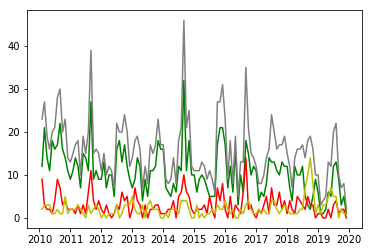

In [829]:
plt.plot(inspection_per_month['Pass'],'g')
plt.plot(inspection_per_month['Fail'],'r')
plt.plot(inspection_per_month['Pass w/ Conditions'],'y')
plt.plot(inspection_per_month['Number of inspections'],'grey')

In [848]:
fc_names = fc['Food_chain'].values.tolist()
fc_names 

['Subway',
 'DunkinDonuts',
 '7Eleven',
 'Mcdonalds',
 'Starbucks',
 'Citgo',
 'DunkinDonutsBaskinRobbins',
 'Cvs',
 'JimmyJohns',
 'Walgreens',
 'BurgerKing',
 'Marathon',
 'Bp',
 'Chipotle',
 'DollarTree',
 'GatewayNewstand',
 'Kfc',
 'Dominos',
 'FamilyDollar',
 'HaroldsChicken',
 'Potbelly',
 'PizzaHut',
 'TacoBell',
 'Wendys',
 'Freshii',
 'Wingstop',
 'AuBonPain',
 'JjFishChicken',
 'Shell',
 'Giordanos',
 'HaroldsChickenShack',
 'Popeyes',
 'CornerBakeryCafe',
 'LaMichoacana',
 'Mobil',
 'SharksFishChicken',
 'JambaJuice',
 'PotbellyLlc',
 'DollarGeneral',
 'WholeFoods',
 'Herbalife',
 'PapaJohnsPizza',
 'Quiznos',
 'Target',
 'ArgoTea',
 'PretAManger',
 'SeeThruChineseKitchen',
 'PeetsCoffeeTea',
 'LouMalnatis',
 'Pockets',
 'HalstedStreetDeli',
 'ProteinBar']

In [863]:
file_name_fc = 'food_chain.pk'
fc.to_pickle(file_name_fc)  

In [865]:
file_name_food = 'food.pk'
food_filtered.to_pickle(file_name_food)  

In [871]:
import pandas as pd
from bokeh.io import curdoc
from bokeh.layouts import column, row
from bokeh.models import ColumnDataSource, PreText, Select
from bokeh.plotting import figure

def construct_df(ticker_name):

    date_pass_sum= food_filtered[food_filtered['AKA Name'] == ticker_name ].groupby('Inspection Date')['Pass'].sum().groupby(pd.Grouper(freq="M")).sum() 
    date_fail_sum= food_filtered[food_filtered['AKA Name'] == ticker_name ].groupby('Inspection Date')['Fail'].sum().groupby(pd.Grouper(freq="M")).sum() 
    date_passwc_sum= food_filtered[food_filtered['AKA Name'] == ticker_name ].groupby('Inspection Date')['Pass w/ Conditions'].sum().groupby(pd.Grouper(freq="M")).sum() 

    inspection_per_month= pd.concat([date_pass_sum, date_fail_sum,date_passwc_sum],axis=1)

    #group by month becuase days is too small 
    inspection_per_month= inspection_per_month.groupby(pd.Grouper(freq="M")).sum()   
    inspection_per_month["Number of inspections"] = inspection_per_month.apply(np.sum,axis=1)
    # get of data frame of the form  Index : Inpsection Data (every month) = [Pass , Fail, Pass w/ Conditions ,Number of inspections]

    return inspection_per_month

#get the data of food chain 
file_name_fc = 'food_chain.pk'
file_name_food = 'food.pk'
fc = pd.read_pickle(file_name_fc)
food_filtered= pd.read_pickle(file_name_food)

# set up widgets
DEFAULT_TICKERS = ['Pass','Fail','Pass w/ Conditions','Number of inspections']
fc_names = fc['Food_chain'].values.tolist()
stats = PreText(text='', width=500)

ticker0 = Select(value='Subway' ,options=fc_names)
ticker1 = Select(value='Number of inspections', options=DEFAULT_TICKERS)
ticker2 = Select(value='Pass', options=DEFAULT_TICKERS)

df = construct_df(ticker0.value)

# set up plots
source = ColumnDataSource(data=df)
tools = 'pan,wheel_zoom,xbox_select,reset'

corr = figure(plot_width=350, plot_height=350,
              tools='pan,wheel_zoom,box_select,reset')

corr.circle(ticker1.value, ticker2.value, size=2, source=source,
            selection_color="orange", alpha=0.6, nonselection_alpha=0.1, selection_alpha=0.4)

ts1 = figure(plot_width=900, plot_height=200, tools=tools, x_axis_type='datetime', active_drag="xbox_select")
ts1.line('Inspection Date', ticker1.value, source=source)
ts1.circle('Inspection Date', ticker1.value, size=1, source=source, color=None, selection_color="orange")

ts2 = figure(plot_width=900, plot_height=200, tools=tools, x_axis_type='datetime', active_drag="xbox_select")
ts2.x_range = ts1.x_range
ts2.line('Inspection Date', ticker2.value, source=source)
ts2.circle('Inspection Date', ticker2.value, size=1, source=source, color=None, selection_color="orange")


# set up callbacks
def ticker_change(attrname, old, new):
    update()

def update(selected=None):
    
    t0, t1, t2 =ticker0.value, ticker1.value, ticker2.value
    
    
    data = construct_df(ticker0.value)
    source.data = data
    
    ts1.line('Inspection Date', t1, source=source)
    ts1.circle('Inspection Date', t1, size=1, source=source, color=None, selection_color="orange")

    ts2.line('Inspection Date', t2, source=source)
    ts2.circle('Inspection Date', t2, size=1, source=source, color=None, selection_color="orange")
    
    update_stats(data)

    corr.title.text = '{0} vs {1} for food chain {2}'.format(t1, t2,t0)
    ts1.title.text, ts2.title.text = t1, t2

def update_stats(data):
    stats.text = str(data.describe())

ticker0.on_change('value', ticker_change)
ticker1.on_change('value', ticker_change)
ticker2.on_change('value', ticker_change)

# set up layout
widgets = column(ticker0, ticker1, ticker2, stats)
main_row = row(corr, widgets)
series = column(ts1, ts2)
layout = column(main_row, series)

# initialize
update()

curdoc().add_root(layout)
curdoc().title = "profile"

#show(layout)  locally

RuntimeError: Models must be owned by only a single document, DaysTicker(id='69842', ...) is already in a doc

In [ ]:
def selection_change(attrname, old, new):
    t1, t2 = ticker1.value, ticker2.value
    data = get_data(t1, t2)
    selected = source.selected.indices
    if selected:
        data = data.iloc[selected, :]
    update_stats(data, t1, t2)

source.selected.on_change('indices', selection_change)

In [ ]:
# initialize
update()

curdoc().add_root(layout)
curdoc().title = "Stocks"